# Исследование рынка заведений общественного питания Москвы

(версия с сокращенной геоаналитикой)

По оценке INFOLine рост рынка общественного питания в России в 2023 году составил 15%. Люди всегда хотят есть, но не всегда имеют достаточно времени или желания, чтобы самостоятельно готовить. Кроме того, часть заведений общественного питания рассматривается не как место утоления голода, а как место проведения досуга, встреч с друзьями или деловых встречь. Есть и те, кто выходит в кафе поработать. Спрос рождает предложение, а соответственно становится актуальным исследование рынка заведений общественного питания, чтобы перейти от идеи открыть новое заведение к разработке конкретного бизнесс-плана.

Заказчик - Инвесторы

**Цель исследования** - установить интересные особенности рынка общественного питания Москвы, которые могут повлиять на выбор типа и места открытия нового заведения общественного питания, проверив гипотезы:

1. В Москве представлен широкий выбор заведений общественного питания, как по категориям, так и по размерам заведения. 
2. В Москве больше сетевых заведений.
4. Большая часть заведений сосредоточена в центре города, их средний рейтинг выше.
5. Самые дорогие заведения находятся в центре Москвы.
6. Moscow never sleeps, а значит большинство заведений работает круглосуточно.
7. В Москве еще можно открыть кофейню, этот сегмент рынка еще не переполнен.

**Описание данных**

name — название заведения;

address — адрес заведения;

category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

hours — информация о днях и часах работы;

lat — широта географической точки, в которой находится заведение;

lng — долгота географической точки, в которой находится заведение;

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

- «Средний счёт: 1000–1500 ₽»;
- «Цена чашки капучино: 130–220 ₽»;
- «Цена бокала пива: 400–600 ₽».
и так далее;

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца 
avg_bill, начинающихся с подстроки «Средний счёт»:
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
- 0 — заведение не является сетевым
- 1 — заведение является сетевым

district — административный район, в котором находится заведение, например Центральный административный округ;

seats — количество посадочных мест.

**Ход исследования**
Для анализа доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года `moscow_places.csv`. Перед проверкой гипотез понадобится обзор данных. Затем, на этапе предобработки необходимо будет исправить ошибки данных.

Таким образом, исследование пройдёт в четыре этапа:
 1. Обзор данных.
 2. Предобработка данных.
 3. Проверка гипотез.
 4. Общий вывод и презентация.

### Обзор данных  

In [1]:
# Импортируем библиотеки
import pandas as pd
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_palette('colorblind') 
from plotly import graph_objects as go
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Устанавливаем библиотеку Folium
!pip install folium

Defaulting to user installation because normal site-packages is not writeable


In [3]:
# Подключаем модуль для работы с JSON-форматом
import json

# Импортируем карту, хороплет и маркер
from folium import Map, Choropleth, Marker

# Импортируем кластер
from folium.plugins import MarkerCluster

# Будем использовать собственные иконки для метро, поэтому импортируем CustomIcon
from folium.features import CustomIcon


In [4]:
data = pd.read_csv('D:/ФОТО/Яндекс.Практикум/Проекты/4.Общепит Москвы/moscow_places.csv')

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [7]:
data.tail()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0


In [8]:
# Перечень названий столбцов таблицы df
data.columns

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats'],
      dtype='object')

Всего строк - 8406. В некоторых столбцах есть пропуски. Названия столбцов понятны, нарушения стиля нет. Типы ячеек в основном соответсвуют содержанию, вопросы вызывает только столбец seats - все-таки количество мест представляется целым числом, но в данном случае этому мешают пропуски. 

### Предобработка данных

In [9]:
#Зафиксируем в переменную количество строк в датасете
data_rows_count = data.shape[0]

#### Дубликаты

In [10]:
# Количество строк-дубликатов
data.duplicated().sum()

0

Строк-дубликатов нет

In [11]:
# Посмотрим на дубликаты по двум столбцам name, address
data.loc[data.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Дубликатов сочетания наименования и адреса нет.

In [12]:
# Просмотр уникальных названий заведений
data['name'].sort_values().unique()

array(['#КешбэкКафе', '+39 Pizzeria Mozzarella bar', '1 Этаж', ...,
       'Ясно', 'Яуза', 'ночной Баку'], dtype=object)

 Слишком много и не понятно, являются ли похожие названия дубликатами или все же это разные заведения. Проверим некоторые из них.

In [13]:
data.query('name=="Main Food" or name=="MainFood" or name=="IQ Coffee" or name=="IQ Кофе" or name=="Lucky Eye" or name=="Lucky Eye. Ближневосточной lounge bar" or name=="Ku: Рамен Изакая бар" or name=="Ku: рамен изакая бар"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1500,IQ Coffee,кофейня,"Москва, Хорошёвское шоссе, 82",Северный административный округ,"ежедневно, 07:00–22:00",55.778284,37.521503,4.3,NaN,NaN,NaN,NaN,0,10.0
3515,Ku: рамен изакая бар,"бар,паб","Москва, Большая Грузинская улица, 69",Центральный административный округ,"ежедневно, 11:00–00:00",55.773953,37.586420,4.7,NaN,NaN,NaN,NaN,0,150.0
4109,Ku: Рамен Изакая бар,"бар,паб","Москва, Пресненская набережная, 10с2",Центральный административный округ,"пн-пт 08:00–00:00; сб,вс 11:00–23:00",55.747495,37.535210,4.6,NaN,NaN,NaN,NaN,0,NaN
4248,IQ Кофе,кофейня,"Москва, Пресненская набережная, 10с2",Центральный административный округ,пн-пт 08:00–20:00; сб 10:00–16:00,55.747450,37.534671,4.4,NaN,NaN,NaN,NaN,0,NaN
4855,Lucky Eye. Ближневосточной lounge bar,"бар,паб","Москва, Большая Андроньевская улица, 23",Центральный административный округ,"ежедневно, 12:00–04:00",55.740462,37.671856,4.4,средние,Средний счёт:800–1300 ₽,1050.0,NaN,0,95.0
6122,Lucky Eye,пиццерия,"Москва, улица Серпуховский Вал, 17",Южный административный округ,"ежедневно, 09:00–02:00",55.711199,37.612555,4.3,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,40.0
7372,Main Food,кофейня,"Москва, Поречная улица, 10",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.649607,37.770211,3.7,NaN,NaN,NaN,NaN,0,0.0
7988,MainFood,кофейня,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 10:00–22:00",55.622056,37.713590,4.5,NaN,NaN,NaN,NaN,0,NaN


Очевидно, что среди данных заведений нет дубликатов. Находятся в разных районах Москвы, имеют разный рейтинг и даже не являются сетевыми, хотя для маленьких сетей могут встречаться ошибки.

In [14]:
data.query('name=="9 Bar Coffe" or name=="9 Bar Coffee"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0
782,9 Bar Coffe,кофейня,"Москва, Алтуфьевское шоссе, 43",Северо-Восточный административный округ,пн-пт 07:30–18:00,55.870479,37.580795,4.4,NaN,NaN,NaN,NaN,0,NaN
1446,9 Bar Coffee,кофейня,"Москва, Ленинградский проспект, 80, корп. 1",Северный административный округ,"пн-пт 07:30–21:00; сб,вс 07:30–19:00",55.810352,37.506625,4.3,NaN,Цена чашки капучино:60–150 ₽,NaN,105.0,1,625.0
2323,9 Bar Coffee,кофейня,"Москва, Стромынский переулок, 4",Восточный административный округ,"пн-пт 08:00–20:00; сб,вс 08:00–18:00",55.793241,37.694106,4.3,NaN,Цена чашки капучино:130–230 ₽,NaN,180.0,1,0.0
4013,9 Bar Coffee,кофейня,"Москва, Бережковская набережная, 16А",Западный административный округ,пн-пт 09:00–19:00,55.737824,37.562717,4.4,NaN,Цена чашки капучино:115–140 ₽,NaN,127.0,1,NaN
5181,9 Bar Coffee,кофейня,"Москва, Космодамианская набережная, 52с1",Центральный административный округ,пн-пт 08:00–20:00,55.732185,37.646987,4.2,NaN,NaN,NaN,NaN,1,NaN
5450,9 Bar Coffee,кофейня,"Москва, Боровая улица, 10к1",Юго-Восточный административный округ,"ежедневно, 08:00–22:00",55.771561,37.713906,4.6,NaN,NaN,NaN,NaN,1,NaN
5572,9 Bar Coffee,кофейня,"Москва, Боровая улица, 7, стр. 2",Юго-Восточный административный округ,пн-пт 08:00–18:30,55.771149,37.714980,4.1,NaN,NaN,NaN,NaN,1,10.0


Тоже не являются дубликатами, расположены по разным адресам. 9 Bar Coffe, возможно, не отметилась сетевым кафе из-за ошибки в названии, а возможно является отдельным несетевым кафе с похожим названием. В целях нашего исследование это не играет существенной роли.

In [15]:
data.query('name=="Bổ" or name=="Bổ"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
946,Bổ,быстрое питание,"Москва, проспект Мира, 211, корп. 2",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.845303,37.661937,4.2,средние,Средний счёт:390–1000 ₽,695.0,NaN,1,273.0
1046,Bổ,быстрое питание,"Москва, проспект Мира, 119, стр. 56",Северо-Восточный административный округ,"ежедневно, 11:00–23:00",55.835957,37.624298,4.3,NaN,NaN,NaN,NaN,1,NaN
1879,Bổ,кафе,"Москва, Лесная улица, 20, стр. 3",Центральный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–02:00; вс 10:00...",55.780240,37.592745,4.3,средние,Средний счёт:800–1000 ₽,900.0,NaN,1,500.0
3141,Bổ,кафе,"Москва, улица Барклая, вл10",Западный административный округ,"ежедневно, 09:00–21:00",55.743105,37.499390,4.5,NaN,NaN,NaN,NaN,1,NaN
3269,Bổ,кафе,"Москва, улица Барклая, 10",Западный административный округ,"ежедневно, 09:00–21:00",55.743388,37.498779,4.5,NaN,NaN,NaN,NaN,1,NaN
3979,Bổ,кафе,"Москва, улица Крымский Вал, 9с64",Центральный административный округ,"ежедневно, 11:00–22:00",55.730218,37.598113,4.5,средние,Средний счёт:300–600 ₽,450.0,NaN,1,NaN
5065,Bổ,быстрое питание,"Москва, улица Балчуг, 5",Центральный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.747173,37.626223,4.5,NaN,NaN,NaN,NaN,1,295.0
6331,Bổ,кафе,"Москва, улица Ленинская Слобода, 26",Южный административный округ,пн-чт 10:00–22:00; пт 10:00–23:00; сб 11:00–23...,55.709157,37.652561,4.5,NaN,NaN,NaN,NaN,1,150.0
6549,Bổ,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661638,37.480148,4.7,NaN,NaN,NaN,NaN,0,NaN
7283,Bổ,быстрое питание,"Москва, Мячковский бульвар, 3А",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.657952,37.751244,4.7,средние,Средний счёт:800 ₽,800.0,NaN,1,0.0


In [16]:
data.query('name=="Bổ"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6549,Bổ,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661638,37.480148,4.7,NaN,NaN,NaN,NaN,0,NaN


Тут интересно. Есть сеть кафе с таким названием и одно несетевое на проспекте Вернадского. У него-то как раз и отличается название, правда, визуально не видно, чем, но данное кафе не является дублем. 

У всех кафе с названием Bổ адреса и координаты разные - не являются дубликатами.



Таким образом, приведение к общему регистру или удаление пробелов не будут иметь должного эффекта, только затруднят чтение наименований заведений. Необходимо найти другой подход к поиску дубликатов.

Попробуем найти дубликаты по координатам.

In [17]:
# Количество дубликатов по координатам (столбцы lat и lng)
data['name'].loc[data.duplicated(subset=['lat', 'lng'], keep=False)].count()

66

Нашлось 66 строк с дублирующимися координатами. Не так много. Посмотрим, есть ли среди них дубликаты или это разные заведения, расположенные близко друг к другу (в одном здании на разных этажах, возможно).

In [18]:
pd.set_option('display.max_rows', None)
data.loc[data.duplicated(subset=['lat', 'lng'], keep=False)].sort_values(by='lat')


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7638,Кофешефф,ресторан,"Москва, Новоясеневский проспект, 7",Юго-Западный административный округ,"ежедневно, 08:30–21:00",55.607489,37.532367,4.3,NaN,NaN,NaN,NaN,0,60.0
7640,Крошка Картошка,быстрое питание,"Москва, Новоясеневский проспект, 7",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.607489,37.532367,4.1,NaN,NaN,NaN,NaN,1,60.0
7787,Тануки,ресторан,"Москва, Липецкая улица, 2, корп. 8",Южный административный округ,"ежедневно, 10:00–05:00",55.608307,37.664941,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,1,120.0
7781,Ёрш,пиццерия,"Москва, Липецкая улица, 2, корп. 8",Южный административный округ,"ежедневно, 11:30–05:00",55.608307,37.664941,4.4,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,1,120.0
7767,За обе щёки,кафе,"Москва, Варшавское шоссе, вл132/2",Южный административный округ,"ежедневно, 09:00–21:00",55.620316,37.608922,3.6,NaN,NaN,NaN,NaN,1,NaN
7660,100лоффка,столовая,"Москва, Варшавское шоссе, вл132/2",Южный административный округ,пн-пт 09:00–17:30,55.620316,37.608922,4.4,низкие,Средний счёт:100–270 ₽,185.0,NaN,0,NaN
6598,Узбечка,столовая,"Москва, улица Академика Волгина, 2А",Юго-Западный административный округ,"ежедневно, 08:00–23:00",55.655107,37.521641,4.6,NaN,NaN,NaN,NaN,1,49.0
6809,Кафе Восток,кафе,"Москва, улица Академика Волгина, 2А",Юго-Западный административный округ,NaN,55.655107,37.521641,2.9,NaN,NaN,NaN,NaN,0,49.0
7407,Старый дворик,кафе,"Москва, улица Нижние Поля, 19Б, стр. 1",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.658424,37.737291,4.1,средние,Средний счёт:от 300 ₽,300.0,NaN,1,45.0
7362,Хинкальная,кафе,"Москва, улица Нижние Поля, 19Б, стр. 1",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.658424,37.737291,4.3,средние,Средний счёт:от 300 ₽,300.0,NaN,1,45.0


Нашлись: 

Чайхана Doner кафе(индекс 2697, есть информация о посадочных местах) и Чайхана Döner(индекс 2841) (Москва, Измайловский проспект, 61, стр. 2 и Москва, Измайловский проспект, 61с2). Оставим строку с более полными данными, т.е. с индексом 2697.

Возможно, являются дубликатами Dragon bubble tea (индекс 2719) и Dragon Mixology Bar (индекс 2866). Есть незначительные расхождения в графике работы. По данным сайта ТРЦ Щелковский, расположенном по адресу данных заведений, в ТРЦ  находится Dragon bubble tea, его и оставим.

Кафе-кулинария Сикварули (индекс 1324) несетевое (chain=0) и Сикварули (индекс 1452) - сетевое (chain=1), 	
More poke (индекс 1430) и More Poke(1511, сетевое),
Leon (индекс 5314, сетевое) и Леон (индес 5316) посмотрим подробнее сетевые, действительно ли есть сеть кафе с такими названиями.

In [19]:
data.query('name=="More Poke" or name=="Сикварули" or name=="Leon"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1053,Leon,ресторан,"Москва, проспект Мира, 119, стр. 10",Северо-Восточный административный округ,"вт-пт 12:00–20:00; сб,вс 12:00–22:00",55.829632,37.629695,4.0,NaN,NaN,NaN,NaN,1,NaN
1452,Сикварули,ресторан,"Москва, улица Куусинена, 11, корп. 2",Северный административный округ,"ежедневно, 10:00–22:00",55.782729,37.513952,4.4,NaN,NaN,NaN,NaN,1,10.0
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
3195,Сикварули,ресторан,"Москва, улица Василисы Кожиной, 13",Западный административный округ,"ежедневно, 11:00–23:00",55.736187,37.499814,4.5,NaN,NaN,NaN,NaN,1,NaN
5314,Leon,ресторан,"Москва, улица Металлургов, 29А",Восточный административный округ,пн-сб 11:00–23:00; вс 12:00–23:00,55.759603,37.791702,4.3,NaN,NaN,NaN,NaN,1,NaN
6088,More Poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


Оставим сетевые, тем более, что на картах ресторан Леон (кириллицей) находится в Московской области, а не в городе Москва.

Таким образом, из датасета необходимо исключить строки с индексами 1324, 1430, 5316, 2841, 2866.

In [20]:
# Удаляем из датасета строки 1324, 1430, 5316, 2841, 2866.
data = data.query('index not in [1324, 1430, 5316, 2841, 2866]')

In [21]:
# Проверяем количество дублированных по координатам строк 
data['name'].loc[data.duplicated(subset=['lat', 'lng'], keep=False)].count()

56

Все верно, их стало на 10 меньше.

In [22]:
#Всего строк
data.shape[0]

8401

Все верно, на 5 меньше. Ничего лишнего не удалено.

Попробуем округлить координаты и поискать еще. Возможно, есть данные с погрешностями в координатах.

In [23]:
#Округляем координаты и записываем их в новый столбец.
data['lat_round'] = round(data['lat'],5)
data['lng_round'] = round(data['lng'],5)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,55.87849,37.47886
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,55.87580,37.48448
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,55.88915,37.52590
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,55.88161,37.48886
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,55.88117,37.44936


In [24]:
# Количество дубликатов по округленным координатам (столбцы lat_round и lng_round)
data['name'].loc[data.duplicated(subset=['lat_round', 'lng_round'], keep=False)].count()

64

In [25]:
data.loc[data.duplicated(subset=['lat_round', 'lng_round'], keep=False)].sort_values(by='lat_round')


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round
7640,Крошка Картошка,быстрое питание,"Москва, Новоясеневский проспект, 7",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.607489,37.532367,4.1,NaN,NaN,NaN,NaN,1,60.0,55.60749,37.53237
7638,Кофешефф,ресторан,"Москва, Новоясеневский проспект, 7",Юго-Западный административный округ,"ежедневно, 08:30–21:00",55.607489,37.532367,4.3,NaN,NaN,NaN,NaN,0,60.0,55.60749,37.53237
7787,Тануки,ресторан,"Москва, Липецкая улица, 2, корп. 8",Южный административный округ,"ежедневно, 10:00–05:00",55.608307,37.664941,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,1,120.0,55.60831,37.66494
7781,Ёрш,пиццерия,"Москва, Липецкая улица, 2, корп. 8",Южный административный округ,"ежедневно, 11:30–05:00",55.608307,37.664941,4.4,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,1,120.0,55.60831,37.66494
7767,За обе щёки,кафе,"Москва, Варшавское шоссе, вл132/2",Южный административный округ,"ежедневно, 09:00–21:00",55.620316,37.608922,3.6,NaN,NaN,NaN,NaN,1,NaN,55.62032,37.60892
7660,100лоффка,столовая,"Москва, Варшавское шоссе, вл132/2",Южный административный округ,пн-пт 09:00–17:30,55.620316,37.608922,4.4,низкие,Средний счёт:100–270 ₽,185.0,NaN,0,NaN,55.62032,37.60892
6809,Кафе Восток,кафе,"Москва, улица Академика Волгина, 2А",Юго-Западный административный округ,NaN,55.655107,37.521641,2.9,NaN,NaN,NaN,NaN,0,49.0,55.65511,37.52164
6598,Узбечка,столовая,"Москва, улица Академика Волгина, 2А",Юго-Западный административный округ,"ежедневно, 08:00–23:00",55.655107,37.521641,4.6,NaN,NaN,NaN,NaN,1,49.0,55.65511,37.52164
7407,Старый дворик,кафе,"Москва, улица Нижние Поля, 19Б, стр. 1",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.658424,37.737291,4.1,средние,Средний счёт:от 300 ₽,300.0,NaN,1,45.0,55.65842,37.73729
7362,Хинкальная,кафе,"Москва, улица Нижние Поля, 19Б, стр. 1",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.658424,37.737291,4.3,средние,Средний счёт:от 300 ₽,300.0,NaN,1,45.0,55.65842,37.73729


Новых дубликатов не обнаружено.

In [26]:
# Просмотр уникальных категорий заведений
data['category'].sort_values().unique()

array(['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня',
       'пиццерия', 'ресторан', 'столовая'], dtype=object)

Дубликатов категорий заведений нет

In [27]:
# Просмотр уникальных категорий уровня цен заведений
data['price'].sort_values().unique()

array(['высокие', 'выше среднего', 'низкие', 'средние', nan], dtype=object)

Дубликатов категорий уровня цен заведений нет

In [28]:
# Просмотр уникальных наименований районов заведений
data['district'].sort_values().unique()

array(['Восточный административный округ',
       'Западный административный округ',
       'Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Центральный административный округ',
       'Юго-Восточный административный округ',
       'Юго-Западный административный округ',
       'Южный административный округ'], dtype=object)

Нет дубликатов в наименовании районов.

In [29]:
# Просмотр уникальных наименований категорий уровня цен заведений
data['price'].sort_values().unique()

array(['высокие', 'выше среднего', 'низкие', 'средние', nan], dtype=object)

Нет дубликатов в наименовании категорий уровня цен.

Дубликатов в наименовании категорий заведений, категорий цен в заведении и наименовании административных округов не обнаружено. Выявлено по координатам местонахождения и удалено несколько дубликатов заведений. Большинство заведений, похожих по наименованию на дубликаты, таковыми не являются.

#### Пропуски

In [30]:
# Количество пропущенных значений для каждого столбца
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5086
avg_bill             4585
middle_avg_bill      5252
middle_coffee_cup    7866
chain                   0
seats                3608
lat_round               0
lng_round               0
dtype: int64

In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8401 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8401 non-null   object 
 1   category           8401 non-null   object 
 2   address            8401 non-null   object 
 3   district           8401 non-null   object 
 4   hours              7865 non-null   object 
 5   lat                8401 non-null   float64
 6   lng                8401 non-null   float64
 7   rating             8401 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8401 non-null   int64  
 13  seats              4793 non-null   float64
 14  lat_round          8401 non-null   float64
 15  lng_round          8401 non-null   float64
dtypes: float64(8), int64(1), obje

Пропуски присутствуют в 6 столбцах. Больше всего пропусков в seats, avg_bill, price, middle_avg_bill, middle_coffee_cup.

middle_avg_bill и middle_coffee_cup зависят от заполнения avg_bill и пропуски в этих столбцах являются нормой.
Проверим, сколько строк в avg_bill начинаются с подстроки "Средний счёт"  и сколько содержат "чашки капучино", сравним с количеством ненулевых строк в middle_avg_bill и middle_coffee_cup.

In [32]:
# Удаляем из датасета строки с нулевым значением в столбце avg_bill и сохраняем в отдельную переменную
data_avg_bill = data.query('~avg_bill.isna()')

# Считаем строки, содержащие подстроки "Средний счет" и "чашки капучино"
middle_avg_bill_count=0
middle_coffee_cup_count=0

for bill in data_avg_bill['avg_bill']:
    if 'Средний счёт' in bill:    
        middle_avg_bill_count+=1
    elif 'чашки капучино' in bill:
        middle_coffee_cup_count+=1
# Выводим на экран получившиеся значения
print(f'Число строк, содержащих слова "Средний счет", равно {middle_avg_bill_count}')
f'Число строк, содержащих данные о стоимости чашки капучино, равно {middle_coffee_cup_count}'


Число строк, содержащих слова "Средний счет", равно 3149


'Число строк, содержащих данные о стоимости чашки капучино, равно 535'

 При этом middle_avg_bill  содержит  3149 non-null значений, а middle_coffee_cup - 535 non-null значений. Следовательно, пустые значения в данных столбцах являются корректными и соответствуют описанию данных.

В seets заполнено меньше половины строк. Часть заведений, действительно, могут не иметь посадочных мест. Рассмотрим возможность заполнить медианным значением количество посадочных мест в сетевых заведениях, предполагая, что сетевые заведения имеют внутренние стандарты в том числе по размеру помещения и количеству посадочных мест. 

In [33]:
#Процент пропущенных данных о количестве посадочных мест в сетевых заведениях
round(data.query('seats.isna() and chain==1').shape[0]/data.query('chain==1').shape[0]*100)

40

В 40% сетевых заведений датасета не указаны данные о количестве посадочных мест. Это много.
Рассмотрим подробнее некоторые из сетей.

In [34]:
data.query('seats.isna() and chain==1').sort_values(by='name').sample()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round
6055,Капучино Кидс,кофейня,"Москва, улица Кедрова, 14, корп. 3",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.68277,37.571482,4.4,средние,Цена чашки капучино:150–250 ₽,NaN,200.0,1,NaN,55.68277,37.57148


In [35]:
data.query('name=="7 Сэндвичей"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round
3899,7 Сэндвичей,кофейня,"Москва, Большой Саввинский переулок, 2, корп. 1",Центральный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–19:00",55.736588,37.570088,4.2,средние,Средний счёт:от 300 ₽,300.0,NaN,1,50.0,55.73659,37.57009
4397,7 Сэндвичей,кофейня,"Москва, Нижний Сусальный переулок, 5, стр. 2",Центральный административный округ,"пн-чт 08:00–23:00; пт 08:00–00:00; сб,вс 09:00...",55.760539,37.662345,4.1,средние,Средний счёт:100–500 ₽,300.0,NaN,1,38.0,55.76054,37.66234
4632,7 Сэндвичей,кофейня,"Москва, 4-й Сыромятнический переулок, 3/5с3",Центральный административный округ,"ежедневно, 09:00–19:00",55.754957,37.667534,4.2,средние,Средний счёт:160–500 ₽,330.0,NaN,1,NaN,55.75496,37.66753
6020,7 Сэндвичей,кофейня,"Москва, 2-й Донской проезд, 4",Южный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–19:00",55.712621,37.594373,3.4,NaN,NaN,NaN,NaN,1,NaN,55.71262,37.59437


In [36]:
data.query('name=="Cinnabon"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round
492,Cinnabon,кофейня,"Москва, Головинское шоссе, 5А",Северный административный округ,"ежедневно, 10:00–22:00",55.839848,37.491365,4.3,NaN,NaN,NaN,NaN,1,NaN,55.83985,37.49136
605,Cinnabon,кофейня,"Москва, Беломорская улица, 16А",Северный административный округ,"ежедневно, 10:00–22:00",55.862800,37.470965,2.0,NaN,NaN,NaN,NaN,1,NaN,55.86280,37.47096
1142,Cinnabon,кофейня,"Москва, проспект Мира, 211к2",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.845581,37.661306,2.6,NaN,NaN,NaN,NaN,1,NaN,55.84558,37.66131
1462,Cinnabon,кофейня,"Москва, Щукинская улица, 42",Северо-Западный административный округ,"ежедневно, 10:00–22:00",55.809361,37.463485,4.1,NaN,Средний счёт:200–400 ₽,300.0,NaN,1,150.0,55.80936,37.46348
1508,Cinnabon,кофейня,"Москва, Хорошёвское шоссе, 27",Северный административный округ,"ежедневно, 10:00–22:00",55.776868,37.523978,4.2,NaN,Средний счёт:300–500 ₽,400.0,NaN,1,45.0,55.77687,37.52398
1552,Cinnabon,кофейня,"Москва, Ленинградское шоссе, 16Ас4",Северный административный округ,"ежедневно, 10:00–23:00",55.823124,37.496721,3.8,низкие,Средний счёт:300–350 ₽,325.0,NaN,1,NaN,55.82312,37.49672
2030,Cinnabon,кофейня,"Москва, Долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,1,230.0,55.77827,37.60199
2305,Cinnabon,кофейня,"Москва, Верхняя Красносельская улица, 3А",Центральный административный округ,"ежедневно, 09:00–22:00",55.785406,37.665729,4.4,NaN,NaN,NaN,NaN,1,160.0,55.78541,37.66573
2853,Cinnabon,кофейня,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.811037,37.801215,3.3,NaN,NaN,NaN,NaN,1,NaN,55.81104,37.80122
3056,Cinnabon,кофейня,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738659,37.410112,4.3,NaN,NaN,NaN,NaN,1,276.0,55.73866,37.41011


Даже у известных сетей количество посадочных мест может сильно варьироваться. Например, у Cinnabon от 45 до 350. При этом пропусков по этому параметру достаточно много. 

Таким образом, считаю, что заполнение пропусков медианным или средним значением в данном случае может иметь очень большую погрешность и не является целесообразным. Оставим пропуски.

Пропуски в столбце price заполним значением unknown, т.к. из описания данных не известны критерии отнесения заведения к той или иной категории цен. Даже, если для данного заведения будет известна средняя стоимость заказа, не известно, достаточно ли этого условия для отнесения к одной из категорий цен и к какой именно.
Пропуски в столбцах hours и avg_bill также заполним unknown.

In [37]:
# Пропуски в price, hours, avg_bill заполним значением unknown
data['price'] = data['price'].fillna('unknown')
data['hours'] = data['hours'].fillna('unknown')
data['avg_bill'] = data['avg_bill'].fillna('unknown')

In [38]:
# Проверим
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill                0
middle_avg_bill      5252
middle_coffee_cup    7866
chain                   0
seats                3608
lat_round               0
lng_round               0
dtype: int64

Там, где возможно, пропуски заполнены.

#### Добавление столбцов

In [39]:
# Cтолбец street с названиями улиц из столбца с адресом
data['street'] = data['address'].str.split(',').str[1] 
data.head(10)


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,NaN,NaN,0,NaN,55.87849,37.47886,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,55.87580,37.48448,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,55.88915,37.52590,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,55.88161,37.48886,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,55.88117,37.44936,Правобережная улица
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,unknown,NaN,NaN,0,NaN,55.88801,37.50957,Ижорская улица
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,55.89075,37.52465,Клязьминская улица
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,55.89064,37.52430,Клязьминская улица
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,55.88004,37.53901,Дмитровское шоссе
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,55.87904,37.52449,Ангарская улица


In [40]:
# Функция для определения круглосуточной работы заведения
def is_24_7(time):
    if time == 'ежедневно, круглосуточно':
        return True
    else:
        return False
    
# Cтолбец is_24_7 с отметкой о круглосуточной работе заведения
data['is_24_7'] = data['hours'].apply(is_24_7)


In [41]:
data.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7
578,Шашлычков,быстрое питание,"Москва, улица Свободы, 56, стр. 4",Северо-Западный административный округ,"ежедневно, 10:00–21:00",55.860721,37.451210,3.5,средние,Средний счёт:от 300 ₽,300.0,NaN,0,NaN,55.86072,37.45121,улица Свободы,False
304,Forest Lounge,"бар,паб","Москва, Ленинградское шоссе, 51, стр. 4",Северный административный округ,пн-чт 12:00–00:00; пт-вс 12:00–01:00,55.849573,37.469999,4.3,unknown,unknown,NaN,NaN,0,230.0,55.84957,37.47000,Ленинградское шоссе,False
5589,Харчевниковъ,столовая,"Москва, 2-я Синичкина улица, 9А, стр. 7",Юго-Восточный административный округ,пн-пт 08:30–16:30,55.761021,37.718860,2.8,unknown,Средний счёт:250–300 ₽,275.0,NaN,1,NaN,55.76102,37.71886,2-я Синичкина улица,False
2609,Про людей,кофейня,"Москва, Амурская улица, 1А, корп. 1",Восточный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.808030,37.757611,4.9,unknown,unknown,NaN,NaN,0,92.0,55.80803,37.75761,Амурская улица,False
6685,Fresh,кафе,"Москва, проспект Вернадского, 39",Западный административный округ,"ежедневно, 09:00–23:00",55.675496,37.505732,4.3,unknown,unknown,NaN,NaN,1,80.0,55.67550,37.50573,проспект Вернадского,False
7725,Merani,ресторан,"Москва, Варшавское шоссе, 141, корп. 11",Южный административный округ,"ежедневно, 11:00–23:00",55.587779,37.602174,4.2,выше среднего,Средний счёт:1000–2000 ₽,1500.0,NaN,0,20.0,55.58778,37.60217,Варшавское шоссе,False
8244,Раф хаус,булочная,"Москва, 2-й Южнопортовый проезд, 14/22",Юго-Восточный административный округ,"ежедневно, 07:00–20:00",55.704323,37.690487,3.8,unknown,unknown,NaN,NaN,0,NaN,55.70432,37.69049,2-й Южнопортовый проезд,False
2209,Coffee Пирапора,кофейня,"Москва, Верхняя Красносельская улица, 34",Центральный административный округ,"ежедневно, 08:00–21:00",55.780299,37.664636,4.6,средние,Цена чашки капучино:220–280 ₽,NaN,250.0,0,20.0,55.78030,37.66464,Верхняя Красносельская улица,False
5141,The Waterfront,кофейня,"Москва, улица Большая Полянка, 51А/9",Центральный административный округ,"пн-пт 07:59–21:00; сб,вс 08:59–21:00",55.731982,37.620645,4.7,средние,Цена чашки капучино:250–300 ₽,NaN,275.0,0,100.0,55.73198,37.62065,улица Большая Полянка,False
3920,My Neighbours Cafe,кафе,"Москва, улица Плющиха, 27",Центральный административный округ,"ежедневно, 10:00–20:00",55.742203,37.577998,4.2,unknown,unknown,NaN,NaN,0,NaN,55.74220,37.57800,улица Плющиха,False


Добавлены столбцы с названием улиц и отметкой о круглосуточной работе заведения.

#### Поиск аномальных значений

In [42]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round
count,8401.000000,8401.000000,8401.000000,3149.000000,535.000000,8401.000000,4793.000000,8401.000000,8401.000000
mean,55.750085,37.608529,4.229937,958.053668,174.721495,0.381502,108.425621,55.750085,37.608529
std,0.069670,0.098553,0.470451,1009.732845,88.951103,0.485784,122.845421,0.069670,0.098553
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000,55.573940,37.355650
25%,55.704882,37.538626,4.100000,375.000000,124.500000,0.000000,40.000000,55.704880,37.538630
50%,55.753373,37.605233,4.300000,750.000000,169.000000,0.000000,75.000000,55.753370,37.605230
75%,55.795033,37.664751,4.400000,1250.000000,225.000000,1.000000,140.000000,55.795030,37.664750
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000,55.928940,37.874470


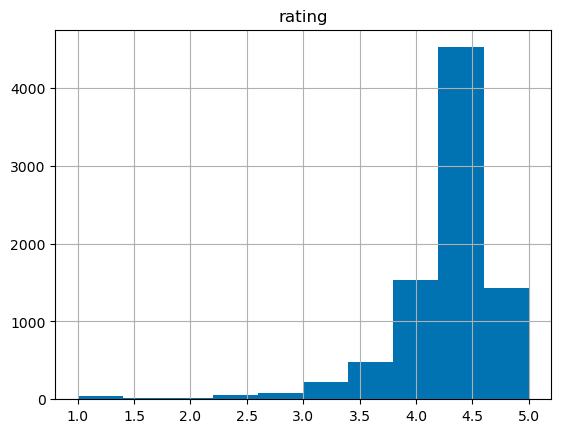

In [43]:
#Гистограмма рейтинга
data.hist(column='rating')
plt.show()

Аномальных значений рейтинга не обнаружено. Рейтинг принимает значения от 1 до 5. Большинство заведений имеет рейтинг от 4 до 5.

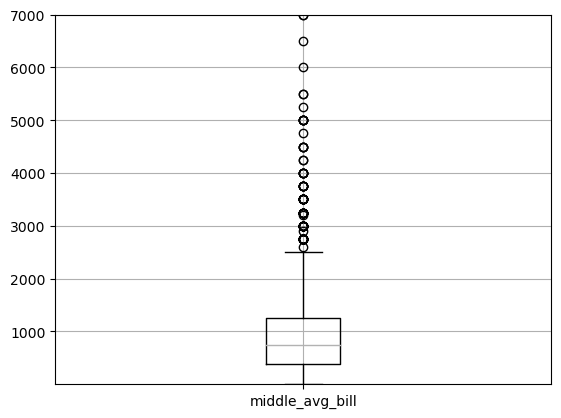

In [44]:
# Диаграмма размаха среднего чека
data.boxplot('middle_avg_bill')
plt.ylim(1,7000)
plt.show()

Достаточно много далеких вылетов в аномальные значения. Максимальный средний счет равен 35000. Посмотрим на самые дорогие заведения.

In [45]:
# Отфильтруем заведения со средним счетом более 2562
data.query('middle_avg_bill>2562').sort_values(by='category')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7
4516,Горыныч,"бар,паб","Москва, Рождественский бульвар, 1",Центральный административный округ,пн-ср 08:00–00:00; чт-сб 08:00–02:00; вс 08:00...,55.766697,37.624477,4.8,высокие,Средний счёт:3000–5000 ₽,4000.0,NaN,0,100.0,55.76670,37.62448,Рождественский бульвар,False
3603,Lucky Izakaya Bar,"бар,паб","Москва, Калашный переулок, 9",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.757313,37.599581,4.8,высокие,Средний счёт:5500 ₽,5500.0,NaN,0,NaN,55.75731,37.59958,Калашный переулок,False
3610,Koji,"бар,паб","Москва, Калашный переулок, 9",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.757111,37.599686,4.5,высокие,Средний счёт:2500–3500 ₽,3000.0,NaN,0,NaN,55.75711,37.59969,Калашный переулок,False
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0,55.87150,37.54356,Дмитровское шоссе,False
3517,Рыбный базар,"бар,паб","Москва, Трёхпрудный переулок, 10/2с2",Центральный административный округ,"ежедневно, 12:00–00:00",55.765681,37.597545,4.7,выше среднего,Средний счёт:4000–5000 ₽,4500.0,NaN,0,NaN,55.76568,37.59754,Трёхпрудный переулок,False
4883,City Space Bar & Restaurant,"бар,паб","Москва, Космодамианская набережная, 52, стр. 6",Центральный административный округ,"пн-чт 17:00–23:00; пт,сб 17:00–00:00; вс 17:00...",55.733463,37.644513,4.7,высокие,Средний счёт:2500–5000 ₽,3750.0,NaN,0,120.0,55.73346,37.64451,Космодамианская набережная,False
3975,Раковая,"бар,паб","Москва, Усачёва улица, 22",Центральный административный округ,"пн-чт 10:00–01:00; пт,сб 10:00–02:00; вс 10:00...",55.727582,37.569834,4.5,высокие,Средний счёт:2000–5000 ₽,3500.0,NaN,1,127.0,55.72758,37.56983,Усачёва улица,False
5204,Garden Cafe,"бар,паб","Москва, Стремянный переулок, 11",Центральный административный округ,"ежедневно, 07:00–00:00",55.727862,37.633033,4.1,высокие,Средний счёт:2500–3000 ₽,2750.0,NaN,0,140.0,55.72786,37.63303,Стремянный переулок,False
5226,Кранцлер,"бар,паб","Москва, улица Балчуг, 1",Центральный административный округ,"ежедневно, 11:00–23:00",55.748202,37.625945,4.3,высокие,Средний счёт:4500–5000 ₽,4750.0,NaN,0,80.0,55.74820,37.62594,улица Балчуг,False
4140,Моремясо,"бар,паб","Москва, 1-й Красногвардейский проезд, 15",Центральный административный округ,"ежедневно, 12:00–00:00",55.750596,37.539106,4.4,высокие,Средний счёт:3000–3500 ₽,3250.0,NaN,0,236.0,55.75060,37.53911,1-й Красногвардейский проезд,False


У всех стоит категория уровня цен - "высокие" или "выше среднего". Смущает наличие в отфильтрованном списке заведения быстрого питания Крошка Картошка со средним счетом 5500, хотя разброс среднего чека достаточно большой - от 1000 до 10000. Кроме того это заведение сети Крошка Картошка находится не в здании аэропорта, что могло бы объяснить столь высокий уровень цен, а в здании ТЦ. Посмотрим на все заведения данной сети.

PhoBo на Арбате со средним чеком от 400 до 6000 руб оставим как есть, все-таки Арбат - это не ТЦ на окраине.

Сложно сказать что-то о Саят-Нова, т.к. это несетевое заведение быстрого питания со средним счетом от 2000 до 3500 р. 

В списке есть одна столовая - РестоБар Argomento. Возможно, ошибка в категории заведения. Действительно, по данным интернета это пивной ресторан. Заменим категорию заведения на "бар,паб".

Рестораны и бары действительно могут иметь высокий уровень цен.

Проверим пиццерию Il Pittore на уровень цен. Это сетевое заведение, соответственно, можно сравнить цены по сети.

In [46]:
#Замена категории заведения у РестоБар Argomento
data.loc[data['name']=='РестоБар Argomento', 'category'] = (
    data.loc[data['name']=='РестоБар Argomento', 'category'].str.replace('столовая', 'бар,паб')
)

#Проверим
data.query('name=="РестоБар Argomento"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7
4231,РестоБар Argomento,"бар,паб","Москва, Кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.738237,37.531819,4.2,высокие,Средний счёт:2500–5000 ₽,3750.0,NaN,0,1200.0,55.73824,37.53182,Кутузовский проспект,False


Теперь правильно.

In [47]:
# Отфильтруем заведения сети Il Pittore
data.query('name=="Il Pittore"').sort_values(by='middle_avg_bill')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7
5734,Il Pittore,пиццерия,"Москва, проспект Вернадского, 29",Юго-Западный административный округ,"ежедневно, 09:00–23:00",55.681352,37.515700,4.4,средние,Средний счёт:750–1000 ₽,875.0,NaN,1,97.0,55.68135,37.51570,проспект Вернадского,False
6871,Il Pittore,пиццерия,"Москва, Нахимовский проспект, 45с1",Юго-Западный административный округ,"ежедневно, 09:00–00:00",55.674875,37.570532,4.7,высокие,Средний счёт:2500–3000 ₽,2750.0,NaN,1,NaN,55.67488,37.57053,Нахимовский проспект,False


Всего два заведения в списке. Возможно, разница в среднем счете связана с местом расположения заведений. Оставим как есть.

In [48]:
# Отфильтруем заведения сети Крошка Картошка
data.query('name=="Крошка Картошка"').sort_values(by='middle_avg_bill')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7
7067,Крошка Картошка,быстрое питание,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.669793,37.553195,3.7,низкие,Средний счёт:190 ₽,190.0,NaN,1,86.0,55.66979,37.55320,Профсоюзная улица,False
7387,Крошка Картошка,быстрое питание,"Москва, Поречная улица, 10",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.649376,37.771200,1.6,средние,Средний счёт:200 ₽,200.0,NaN,1,0.0,55.64938,37.77120,Поречная улица,False
272,Крошка Картошка,быстрое питание,"Москва, МКАД, 87-й километр, 8",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.898566,37.629772,4.0,средние,Средний счёт:250–300 ₽,275.0,NaN,1,NaN,55.89857,37.62977,МКАД,False
544,Крошка Картошка,быстрое питание,"Москва, Фестивальная улица, 2Б",Северный административный округ,"ежедневно, 10:00–22:00",55.854182,37.477145,4.0,средние,Средний счёт:280–320 ₽,300.0,NaN,1,53.0,55.85418,37.47714,Фестивальная улица,False
991,Крошка Картошка,быстрое питание,"Москва, Ярославское шоссе, 54",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.865489,37.704081,4.2,средние,Средний счёт:200–400 ₽,300.0,NaN,1,69.0,55.86549,37.70408,Ярославское шоссе,False
7479,Крошка Картошка,быстрое питание,"Москва, улица Перерва, 43к1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.659686,37.749429,3.6,средние,Средний счёт:до 300 ₽,300.0,NaN,1,NaN,55.65969,37.74943,улица Перерва,False
7965,Крошка Картошка,быстрое питание,"Москва, Ореховый бульвар, 14к3",Южный административный округ,"ежедневно, 10:00–22:00",55.610073,37.720370,3.9,средние,Средний счёт:до 300 ₽,300.0,NaN,1,NaN,55.61007,37.72037,Ореховый бульвар,False
3365,Крошка Картошка,быстрое питание,"Москва, Кутузовский проспект, 57",Западный административный округ,"ежедневно, 10:00–22:00",55.727728,37.477653,3.9,средние,Средний счёт:300–350 ₽,325.0,NaN,1,96.0,55.72773,37.47765,Кутузовский проспект,False
2795,Крошка Картошка,быстрое питание,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"ежедневно, 10:00–22:00",55.811160,37.799823,4.0,высокие,Средний счёт:1000–10000 ₽,5500.0,NaN,1,NaN,55.81116,37.79982,Щёлковское шоссе,False
41,Крошка Картошка,быстрое питание,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878515,37.479308,4.1,unknown,unknown,NaN,NaN,1,NaN,55.87852,37.47931,улица Дыбенко,False


Несложно заметить, что обычный счет в заведениях данной сети около 300 руб. Заменим медианным значением, рассчитанным без учета аномального заведения. Кроме того, внесем исправления в столбец avg_bill и заменим категорию заведения в столбце price с "высокие" на "средние".
Заполним пропуски по данной сети в middle_avg_bill и avg_bill на медианное значение, а также скорректируем значения в столбце price.

In [49]:
# Фильтр заведений для расчета медианного значения среднего чека
data_kk = data.query('name=="Крошка Картошка" and middle_avg_bill<5000')

# Расчет медианного значения среднего чека сети
middle_avg_bill_kk =data_kk['middle_avg_bill'].median()

# Условие для замены
rows = (data['name']=='Крошка Картошка') & (data['middle_avg_bill']==5500)

# Замена наименование категории цен заведения с "высокие" на "средние"
data.loc[rows,'price'] = 'средние'

#Замена аномально высокого значения в столбце middle_avg_bill на медианное по сети
data.loc[rows,'middle_avg_bill'] = middle_avg_bill_kk

# Замена диапазона среднего чека на медианное значение в столбце avg_bill
data.loc[data['name']=='Крошка Картошка', 'avg_bill'] = (
    data.query('name=="Крошка Картошка"')['avg_bill']
    .str.replace('1000–10000', str(round(middle_avg_bill_kk)))
)

# Заполнение пропусков в middle_avg_bill по сети медианным значением
data.loc[data['name']=='Крошка Картошка', 'middle_avg_bill'] = (
    data.loc[data['name']=='Крошка Картошка', 'middle_avg_bill'].fillna(middle_avg_bill_kk)
)

# Замена значения unknown в avg_bill по сети медианным значением
avg_bill_kk = 'Средний счёт:'+str(round(middle_avg_bill_kk))+' ₽'
data.loc[data['name']=='Крошка Картошка', 'avg_bill'] = (
    data.loc[data['name']=='Крошка Картошка', 'avg_bill'].str.replace('unknown', avg_bill_kk)
)

# Замена значения unknown в столбце price на "средние"
data.loc[data['name']=='Крошка Картошка', 'price'] = (
    data.loc[data['name']=='Крошка Картошка', 'price'].str.replace('unknown', 'средние')
)

# Проверяем замены
data.query('name=="Крошка Картошка"').sort_values(by='middle_avg_bill')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7
7067,Крошка Картошка,быстрое питание,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.669793,37.553195,3.7,низкие,Средний счёт:190 ₽,190.0,NaN,1,86.0,55.66979,37.55320,Профсоюзная улица,False
7387,Крошка Картошка,быстрое питание,"Москва, Поречная улица, 10",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.649376,37.771200,1.6,средние,Средний счёт:200 ₽,200.0,NaN,1,0.0,55.64938,37.77120,Поречная улица,False
272,Крошка Картошка,быстрое питание,"Москва, МКАД, 87-й километр, 8",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.898566,37.629772,4.0,средние,Средний счёт:250–300 ₽,275.0,NaN,1,NaN,55.89857,37.62977,МКАД,False
41,Крошка Картошка,быстрое питание,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878515,37.479308,4.1,средние,Средний счёт:300 ₽,300.0,NaN,1,NaN,55.87852,37.47931,улица Дыбенко,False
7479,Крошка Картошка,быстрое питание,"Москва, улица Перерва, 43к1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.659686,37.749429,3.6,средние,Средний счёт:до 300 ₽,300.0,NaN,1,NaN,55.65969,37.74943,улица Перерва,False
6898,Крошка Картошка,быстрое питание,"Москва, улица Каховка, 29А",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.656147,37.569721,4.3,средние,Средний счёт:300 ₽,300.0,NaN,1,NaN,55.65615,37.56972,улица Каховка,False
6467,Крошка Картошка,быстрое питание,"Москва, Вешняковская улица, 18",Восточный административный округ,"ежедневно, 10:00–22:00",55.724027,37.825302,3.6,средние,Средний счёт:300 ₽,300.0,NaN,1,124.0,55.72403,37.82530,Вешняковская улица,False
6237,Крошка Картошка,быстрое питание,"Москва, улица Вавилова, 3",Южный административный округ,"ежедневно, 09:00–22:00",55.705970,37.593998,3.9,средние,Средний счёт:300 ₽,300.0,NaN,1,320.0,55.70597,37.59400,улица Вавилова,False
3334,Крошка Картошка,кафе,"Москва, Береговой проезд, 5А, корп. 7",Западный административный округ,"ежедневно, 08:00–00:00",55.754798,37.509559,4.6,средние,Средний счёт:300 ₽,300.0,NaN,1,56.0,55.75480,37.50956,Береговой проезд,False
2985,Крошка Картошка,ресторан,"Москва, Открытое шоссе, 4с1",Восточный административный округ,"ежедневно, 10:00–22:00",55.809355,37.729886,2.2,средние,Средний счёт:300 ₽,300.0,NaN,1,NaN,55.80936,37.72989,Открытое шоссе,False


Замены прошли успешно

Проверим наличие аномальных значений в middle_coffee_cup

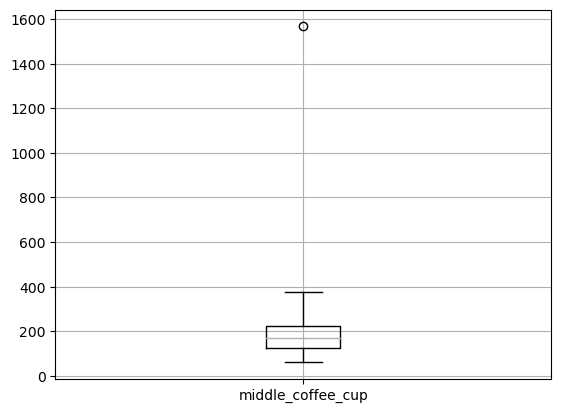

In [50]:
# Диаграмма размаха средней стоимости чашки капучино
data.boxplot('middle_coffee_cup')
plt.show()

Есть аномально высокое значение стоимости чашки капучино. Оно же равно максимальному значению 1568 руб. Посмотрим, где продают такой дорогой кофе.

In [51]:
# Отфильтруем заведения с аномально высокой стоимостью чашки капучино
data.query('middle_coffee_cup>390')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0,55.78227,37.70902,Большая Семёновская улица,False


Как ни странно, это Шоколадница. По всей видимости, опечатка в данных. Посмотрим картину в целом по сети.

In [52]:
data.query('name=="Шоколадница"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7
151,Шоколадница,кофейня,"Москва, Дмитровское шоссе, 163Ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.910447,37.542227,4.1,unknown,Цена чашки капучино:239–274 ₽,NaN,256.0,1,NaN,55.91045,37.54223,Дмитровское шоссе,False
240,Шоколадница,кофейня,"Москва, Широкая улица, 13А",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.887990,37.662485,4.1,unknown,Цена чашки капучино:239–274 ₽,NaN,256.0,1,75.0,55.88799,37.66248,Широкая улица,False
343,Шоколадница,кофейня,"Москва, Фестивальная улица, 13, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.855703,37.477670,4.3,unknown,Цена чашки капучино:239–274 ₽,NaN,256.0,1,100.0,55.85570,37.47767,Фестивальная улица,False
360,Шоколадница,кофейня,"Москва, Сходненская улица, 25",Северо-Западный административный округ,"ежедневно, 08:00–23:00",55.846066,37.438897,4.3,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,130.0,55.84607,37.43890,Сходненская улица,False
381,Шоколадница,кофейня,"Москва, Сходненская улица, 56",Северо-Западный административный округ,"ежедневно, 10:00–22:00",55.850700,37.443523,4.3,unknown,unknown,NaN,NaN,1,140.0,55.85070,37.44352,Сходненская улица,False
455,Шоколадница,кофейня,"Москва, улица Адмирала Макарова, 6, стр. 13",Северный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00...",55.835660,37.490497,4.2,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,80.0,55.83566,37.49050,улица Адмирала Макарова,False
483,Шоколадница,кофейня,"Москва, Кронштадтский бульвар, 3А",Северный административный округ,"ежедневно, 10:00–22:00",55.840448,37.485482,4.1,unknown,Средний счёт:до 650 ₽,650.0,NaN,1,NaN,55.84045,37.48548,Кронштадтский бульвар,False
512,Шоколадница,кафе,"Москва, Ленинградское шоссе, 16А, стр. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.823176,37.497703,4.1,unknown,unknown,NaN,NaN,1,230.0,55.82318,37.49770,Ленинградское шоссе,False
529,Шоколадница,кофейня,"Москва, Головинское шоссе, 5, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.840620,37.491368,4.1,unknown,Цена чашки капучино:179–249 ₽,NaN,214.0,1,140.0,55.84062,37.49137,Головинское шоссе,False
832,Шоколадница,кофейня,"Москва, Дмитровское шоссе, 89",Северный административный округ,"ежедневно, 10:00–22:00",55.863821,37.545451,4.0,unknown,unknown,NaN,NaN,1,55.0,55.86382,37.54545,Дмитровское шоссе,False


Интересно, что данные по сети разнятся. Иногда для Шоколадницы указана не стоимость чашки капучино, а средний счет. Бывает, что диапазон стоимости чашки кофе отличается на 10 рублей. Например, чаще всего встречается запись "Цена чашки капучино:239–274 ₽", но есть и запись "Цена чашки капучино:249–284 ₽". Возможно, данные собирались в разное время или из разных источников и попали на момент поднятия цен в кофейне.

Т.к. у нас нет критериев, по каким заведениям указывается средний счет, а по каким средняя стоимость чашки капучино, то данные о среднем счете менять не будем. Посчитаем медианное значение стоимости чашки капучино и заменим им аномальное значение, а также заполним пропуски в данных. Кроме того, по одной из точек указана категория "кафе", заменим на "кофейня".

In [53]:
# Фильтр заведений для расчета медианного значения стоимости чашки капучино
#data_sh = data.query('name=="Шоколадница"')

# Расчет медианного значения стоимости чашки капучино
middle_coffee_cup_sh =data.query('name=="Шоколадница"')['middle_coffee_cup'].median()

# Условие для замены
rows = (data['name']=='Шоколадница') & (data['middle_coffee_cup']==1568)

#Замена аномально высокого значения в столбце middle_coffee_cup на медианное по сети
data.loc[rows,'middle_coffee_cup'] = middle_coffee_cup_sh

# Замена диапазона среднего чека на медианное значение в столбце avg_bill
data.loc[data['name']=='Шоколадница', 'avg_bill'] = (
    data.query('name=="Шоколадница"')['avg_bill']
    .str.replace('230–2907', str(round(middle_coffee_cup_sh)))
)

# Заполнение пропусков в middle_coffee_cup по сети медианным значением
data.loc[data['name']=='Шоколадница', 'middle_coffee_cup'] = (
    data.loc[data['name']=='Шоколадница', 'middle_coffee_cup'].fillna(middle_coffee_cup_sh)
)

# Замена значения unknown в avg_bill по сети медианным значением
avg_bill_sh = 'Цена чашки капучино:'+str(round(middle_coffee_cup_sh))+' ₽'
data.loc[data['name']=='Шоколадница', 'avg_bill'] = (
    data.loc[data['name']=='Шоколадница', 'avg_bill'].str.replace('unknown', avg_bill_sh)
)

# Замена значения unknown в столбце price на "средние"
data.loc[data['name']=='Шоколадница', 'price'] = (
    data.loc[data['name']=='Шоколадница', 'price'].str.replace('unknown', 'средние')
)

#Замена категории заведения
data.loc[data['name']=='Шоколадница', 'category'] = (
    data.loc[data['name']=='Шоколадница', 'category'].str.replace('кафе', 'кофейня')
)

# Проверяем замены
data.query('name=="Шоколадница"').sort_values(by='middle_coffee_cup')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7
2076,Шоколадница,кофейня,"Москва, Ленинградский проспект, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.780158,37.578868,4.1,средние,Цена чашки капучино:от 170 ₽,NaN,170.0,1,65.0,55.78016,37.57887,Ленинградский проспект,False
529,Шоколадница,кофейня,"Москва, Головинское шоссе, 5, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.840620,37.491368,4.1,средние,Цена чашки капучино:179–249 ₽,NaN,214.0,1,140.0,55.84062,37.49137,Головинское шоссе,False
1190,Шоколадница,кофейня,"Москва, Строгинский бульвар, 1, корп. 2",Северо-Западный административный округ,"ежедневно, 08:00–23:00",55.805747,37.396303,4.2,средние,Цена чашки капучино:150–290 ₽,NaN,220.0,1,70.0,55.80575,37.39630,Строгинский бульвар,False
3048,Шоколадница,кофейня,"Москва, Ярцевская улица, 32",Западный административный округ,"пн-пт 07:30–22:00; сб,вс 09:00–22:00",55.740836,37.418254,4.2,средние,Цена чашки капучино:150–290 ₽,NaN,220.0,1,94.0,55.74084,37.41825,Ярцевская улица,False
6796,Шоколадница,кофейня,"Москва, Ленинский проспект, 109",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.664042,37.511824,3.9,средние,Цена чашки капучино:179–275 ₽,NaN,227.0,1,98.0,55.66404,37.51182,Ленинский проспект,False
5182,Шоколадница,кофейня,"Москва, улица Большая Полянка, 26с1",Центральный административный округ,"пн-пт 07:00–23:00; сб,вс 09:00–22:00",55.737163,37.618825,4.3,средние,Цена чашки капучино:179–314 ₽,NaN,246.0,1,NaN,55.73716,37.61882,улица Большая Полянка,False
2646,Шоколадница,кофейня,"Москва, Измайловская площадь, 1",Восточный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.792214,37.775198,4.3,средние,Цена чашки капучино:250 ₽,NaN,250.0,1,NaN,55.79221,37.77520,Измайловская площадь,False
4088,Шоколадница,кофейня,"Москва, Зубовский бульвар, 17, стр. 1",Центральный административный округ,"ежедневно, круглосуточно",55.736329,37.590706,4.2,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,320.0,55.73633,37.59071,Зубовский бульвар,True
5188,Шоколадница,кофейня,"Москва, бульвар Энтузиастов, 2",Центральный административный округ,пн-чт 07:00–23:00; пт 07:00–00:00; сб круглосу...,55.746561,37.682373,4.1,средние,Цена чашки капучино:256 ₽,NaN,256.0,1,120.0,55.74656,37.68237,бульвар Энтузиастов,False
5171,Шоколадница,кофейня,"Москва, Климентовский переулок, 10с1",Центральный административный округ,пн-чт 08:00–23:00; пт 08:00–00:00; сб круглосу...,55.740936,37.627642,4.2,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,NaN,55.74094,37.62764,Климентовский переулок,False


Категория заведения исправлена. Аномально высокое значение стоимости чашки капучино исправлено. Заполнены значения средней стоимости чашки капучино по тем заведениям сети, где этих данных не было, а также проставлена категория цен в столбце price.

Проверим на наличие аномалий столбец seats.

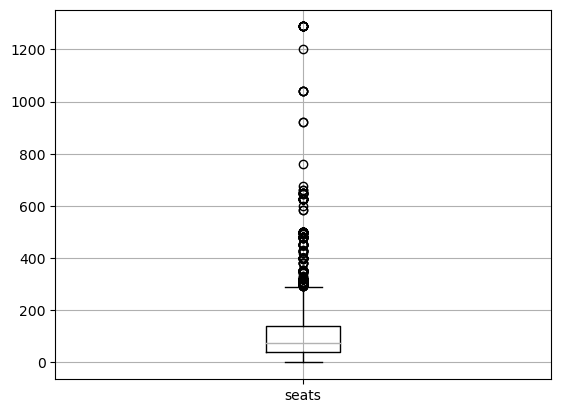

In [54]:
# Диаграмма размаха количества посадочных мест
data.boxplot('seats')
plt.show()

In [55]:
# Отфильтруем заведения с аномально высоким количеством посадочных мест
data.query('seats>290').sort_values(by='seats', ascending=False)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7
6838,Alternative coffee,кофейня,"Москва, проспект Вернадского, 41, стр. 1",Западный административный округ,"пн-пт 09:00–21:00; сб,вс 09:00–22:00",55.673128,37.502992,4.3,unknown,unknown,NaN,NaN,0,1288.0,55.67313,37.50299,проспект Вернадского,False
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0,55.65258,37.47573,проспект Вернадского,True
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288.0,55.66733,37.49060,проспект Вернадского,False
6690,Японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,unknown,55.657255,37.481547,4.4,unknown,unknown,NaN,NaN,1,1288.0,55.65726,37.48155,проспект Вернадского,False
6771,Точка,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,unknown,55.665634,37.477830,4.7,unknown,unknown,NaN,NaN,1,1288.0,55.66563,37.47783,проспект Вернадского,False
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,unknown,unknown,NaN,NaN,0,1288.0,55.66514,37.47860,проспект Вернадского,False
6808,Яндекс Лавка,ресторан,"Москва, проспект Вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.672580,37.507753,4.0,unknown,unknown,NaN,NaN,1,1288.0,55.67258,37.50775,проспект Вернадского,True
6641,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,unknown,unknown,NaN,NaN,1,1288.0,55.66513,37.47863,проспект Вернадского,False
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,unknown,unknown,NaN,NaN,1,1288.0,55.66750,37.49100,проспект Вернадского,False
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0,55.65717,37.48152,проспект Вернадского,False


По адресу Москва, проспект Вернадского, 84, стр.1 находится Российская академия народного хозяйства и государственной службы при Президенте Российской Федерации (РАНХиГС). 
Что указано в заведениях, расположенных в здании учебного заведения, в качестве посадочных мест непонятно, но очевидно, что каждое из них не может иметь по 1288 мест.

Заметно, что одинаковым значением по количеству посадочных мест заполнено по несколько заведений на одной улице. Такое ощущение, что данные были заполнены средним значением по заведениям, расположенным на одной улице. Какие из этих данных являются достоверными, понять сложно. Поэтому оставим, как есть, но при  анализе посадочных мест по категориям заведений будем иметь ввиду, что есть недостоверные данные о количестве посадочных мест.

Яндекс Лавка по адресу Москва, проспект Вернадского, 51, стр. 1 или Москва, Варшавское шоссе, 114, корп. 2 - доставка продуктов, а не ресторан. Как попало в датасет по заведениям общепита, да еще и с количеством посадочных мест от 380 до 1288, непонятно. Посмотрим подробнее на сеть Яндекс Лавка.

In [56]:
data.query('name=="Яндекс Лавка"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7
162,Яндекс Лавка,ресторан,"Москва, Дмитровское шоссе, 107с17",Северный административный округ,"ежедневно, 07:00–00:00",55.881291,37.539301,4.3,unknown,unknown,NaN,NaN,1,NaN,55.88129,37.53930,Дмитровское шоссе,False
193,Яндекс Лавка,ресторан,"Москва, Алтуфьевское шоссе, 79А, стр. 25",Северо-Восточный административный округ,"ежедневно, 07:00–00:00",55.886778,37.584891,3.3,unknown,unknown,NaN,NaN,1,NaN,55.88678,37.58489,Алтуфьевское шоссе,False
212,Яндекс Лавка,ресторан,"Москва, Алтуфьевское шоссе, 50",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.877394,37.587687,4.2,unknown,unknown,NaN,NaN,1,22.0,55.87739,37.58769,Алтуфьевское шоссе,True
836,Яндекс Лавка,ресторан,"Москва, Дубнинская улица, 12, корп. 2",Северный административный округ,unknown,55.864447,37.569733,4.0,unknown,unknown,NaN,NaN,1,124.0,55.86445,37.56973,Дубнинская улица,False
1041,Яндекс Лавка,ресторан,"Москва, улица Лётчика Бабушкина, 15",Северо-Восточный административный округ,"ежедневно, 07:00–00:00",55.863546,37.673501,4.2,unknown,unknown,NaN,NaN,1,NaN,55.86355,37.67350,улица Лётчика Бабушкина,False
1153,Яндекс Лавка,ресторан,"Москва, Будайский проезд, 1",Северо-Восточный административный округ,"ежедневно, 07:00–02:00",55.834932,37.664534,2.9,unknown,unknown,NaN,NaN,1,NaN,55.83493,37.66453,Будайский проезд,False
1443,Яндекс Лавка,ресторан,"Москва, Большой Волоколамский проезд, 12, корп...",Северо-Западный административный округ,"ежедневно, 07:00–00:00",55.801175,37.494331,4.0,unknown,unknown,NaN,NaN,1,NaN,55.80118,37.49433,Большой Волоколамский проезд,False
1530,Яндекс Лавка,ресторан,"Москва, улица Викторенко, 16, стр. 5",Северный административный округ,"ежедневно, 07:00–00:00",55.794391,37.522755,4.2,unknown,unknown,NaN,NaN,1,NaN,55.79439,37.52275,улица Викторенко,False
1533,Яндекс Лавка,ресторан,"Москва, улица Космонавта Волкова, 6А",Северный административный округ,"ежедневно, 07:00–00:00",55.815155,37.512728,4.2,unknown,unknown,NaN,NaN,1,180.0,55.81516,37.51273,улица Космонавта Волкова,False
1541,Яндекс Лавка,ресторан,"Москва, Новохорошёвский проезд, 20",Северо-Западный административный округ,"ежедневно, 07:00–00:00",55.778370,37.493362,4.2,unknown,unknown,NaN,NaN,1,NaN,55.77837,37.49336,Новохорошёвский проезд,False


Сеть ресторанов Яндекс Лавка с абсолютно разным количеством посадочных мест. 
Т.к. Яндекс Лавка — это онлайн-магазин с экспресс-доставкой продуктов из дарксторов, а не сеть точек общепита, да еще и с посадочными местами, удалим из датасета сеть ресторанов Яндекс Лавка.

In [57]:
#Удаляем сеть Яндекс Лавка из датасета
data = data.query('name!="Яндекс Лавка"')

In [58]:
#Количество строк в датасете после обработки и расчет доли данных, оставшихся после фильтрации
data_rows_count_after = data.shape[0]
f'Осталось {data_rows_count_after/data_rows_count:.2%} изначальных данных'

'Осталось 99.12% изначальных данных'

В процессе предобработки данных были удалены найденные неявные дубликаты. Полных дубликатов не обнаружено. 

В датасете достаточно большое количество пропусков в шести столбцах. Большинство пропусков заполнить не представляется возможным.

Нарушение стиля в наименовании столбцов не обнаружено.

Добавлены столбцы street с названием улиц и is_24_7 c отметкой о круглосуточной работе заведения.

Аномальных значений рейтинга не обнаружено. Аномальные значения среднего счета, средней стоимости чашки капучино исправлены. Остались аномальные значения количества посадочных мест, с которыми пока непонятно, что делать.

Попутно исправлены несколько категорий заведений, категорий цен в заведении. Удалены рестораны Яндекс Лавка, т.к. это скорее сеть магазинов, а не заведений общепита.

После предобработки осталось 99.12% изначальных данных - достаточное количество для анализа.

### Анализ данных и проверка гипотез

#### Распределение заведений общественного питания по категориям

In [59]:
# Построение сводной таблицы с подсчетом количества заведений той или иной категории
data_category_pivot = (data.pivot_table(index='category',values='name',aggfunc=('count'))
                       .reset_index().sort_values(by='name',ascending=False)
)

# Переименование столбцов
data_category_pivot = data_category_pivot.rename(columns={'category':'Категория заведения','name':'Количество'})

# Вывод таблицы
data_category_pivot

,Категория заведения,Количество
3,кафе,2375
6,ресторан,1971
4,кофейня,1414
0,"бар,паб",766
5,пиццерия,633
2,быстрое питание,603
7,столовая,314
1,булочная,256


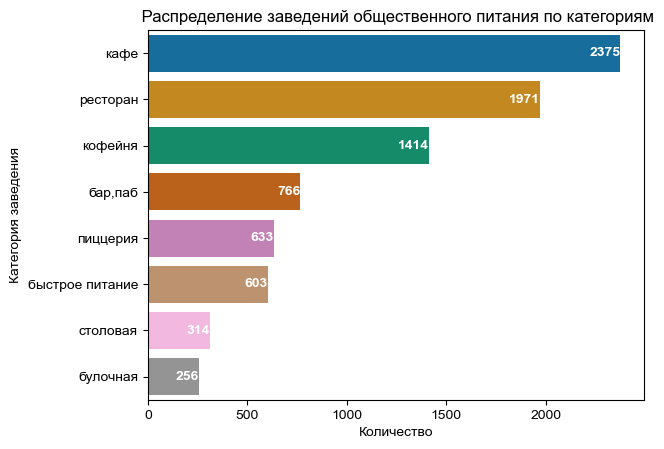

In [60]:
# Построение графика
sns.set_palette('colorblind')
ax = sns.barplot(x='Количество', y='Категория заведения', data=data_category_pivot)
for n in ax.patches:
    ax.text(n.get_width(),n.get_y()+n.get_height()/2., str(int(n.get_width())), 
            fontsize=10, color='white', weight='bold', ha='right', va='center')
plt.title(' Распределение заведений общественного питания по категориям')
sns.set_style('whitegrid')

plt.show()

В данных представлено восемь категорий заведений. Тройка лидеров по количеству заведений - кафе, ресторан, кофейня. Меньше всего столовых и булочных.

#### Исследование количества посадочных мест в заведениях по категориям:рестораны, кофейни, пиццерии, бары и так далее. 

В процессе предобработки данных было обнаружено большое число аномально высоких значений количества посадочных мест по разным категориям заведений. Исправить эти аномалии не представляется возможным, поэтому посмотрим медианное значение по каждой категории.

In [61]:
# Построение сводной таблицы с подсчетом количества заведений той или иной категории
data_seats_pivot = (data.pivot_table(index='category',values='seats',aggfunc=('median'))
                       .reset_index().sort_values(by='seats',ascending=False)
)

# Переименование столбцов
data_seats_pivot = data_seats_pivot.rename(columns={'category':'Категория заведения','seats':'Количество мест'})

# Вывод таблицы
data_seats_pivot

,Категория заведения,Количество мест
6,ресторан,90.0
0,"бар,паб",83.0
4,кофейня,80.0
7,столовая,75.0
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


Ожидаемо самое большое количество посадочных мест в ресторанах, за ними идут бары, пабы, кофейни, столовые. Значения от категории к категории меняются незначительно. 

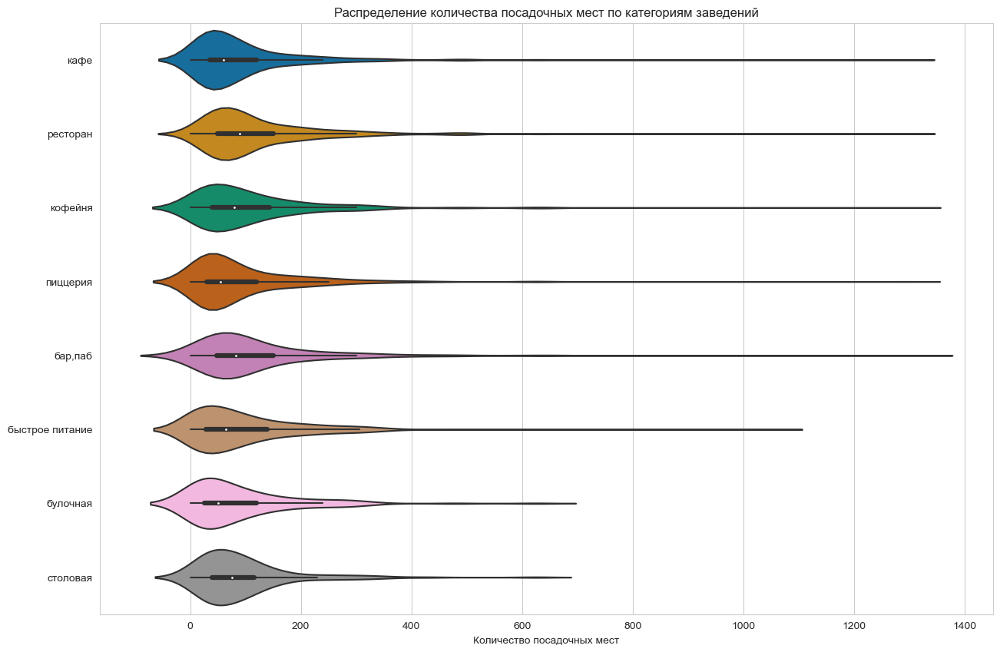

In [62]:
plt.figure(figsize=(15,10))
sns.violinplot(y='category', x='seats', data=data)
plt.title('Распределение количества посадочных мест по категориям заведений')
plt.xlabel('Количество посадочных мест')
plt.ylabel(None)
sns.set_style('whitegrid')
plt.show()

По всем категориям наблюдаются идентичные распределения, схожие с нормальным. У всех - большой хвост аномально высоких значений, связанных с некорректностью данных. При этом, аномально высоких значений настолько много, что исключить их из данных невозможно, исправить тоже. Для того, чтобы использовать данные о количестве посадочных мест для принятия решений по открытию заведения общественного питания, необходимо найти корректные данные по этому параметру.

#### Соотношение сетевых и несетевых заведений в датасете.

In [63]:
# Cтолбец с меткой о принадлежности заведения к сети заменяем на более читаемый
data['chain_cat'] = data['chain'].apply(lambda x: 'сетевое' if x == 1 else 'несетевое')


# Построение сводной таблицы с подсчетом количества сетевых и несетевых
data_chain_pivot = (data.pivot_table(index='chain_cat',values='name',aggfunc=('count'))
                       .reset_index()
)

# Переименование столбцов
data_chain_pivot = data_chain_pivot.rename(columns={'chain_cat':'Категория заведения','name':'Количество'})

# Вывод таблицы
data_chain_pivot

,Категория заведения,Количество
0,несетевое,5196
1,сетевое,3136


In [64]:
fig = go.Figure(data=[go.Pie(labels=data_chain_pivot['Категория заведения'], values=data_chain_pivot['Количество'])])
fig.update_layout(title='Cоотношение сетевых и несетевых заведений общественного питания', 
                  width=700, 
                  height=390,                 
                  annotations=[dict(x=1.23, 
                                    y=1.05,
                                    text='Тип заведения',
                                    showarrow=False)])
fig.show()

Среди всех заведений, представленных в датасете, несетевых больше. Их доля составляет чуть больше 60%. Посмотрим на соотношение сетевых и несетевых заведений в разрезе категорий.

In [65]:
# Группировка по категории и принадлежности к сетевым с подсчетом количества
chain_objects_gr = data.groupby(['category', 'chain_cat'])['name'].count().reset_index()
# Переименование столбцов
chain_objects_gr.columns = ['Категория заведения', 'Принадлежность к сети', 'Количество']
chain_objects_gr

,Категория заведения,Принадлежность к сети,Количество
0,"бар,паб",несетевое,597
1,"бар,паб",сетевое,169
2,булочная,несетевое,99
3,булочная,сетевое,157
4,быстрое питание,несетевое,371
5,быстрое питание,сетевое,232
6,кафе,несетевое,1597
7,кафе,сетевое,778
8,кофейня,несетевое,693
9,кофейня,сетевое,721


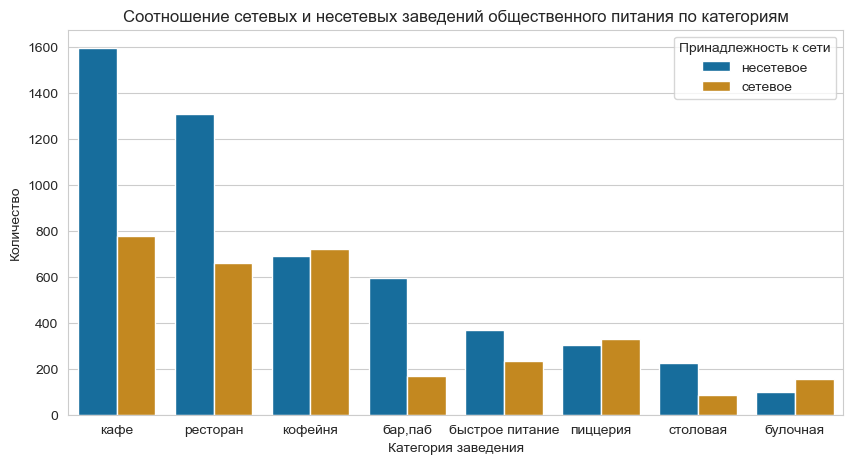

In [66]:
# Сортировка данных для построения графика
chain_objects_gr = chain_objects_gr.sort_values('Количество', ascending=False)

#График
plt.figure(figsize=(10,5))
sns.barplot(
    x='Категория заведения', 
    y='Количество', 
    hue='Принадлежность к сети', 
    data=chain_objects_gr
)
plt.title('Cоотношение сетевых и несетевых заведений общественного питания по категориям')
sns.set_style('whitegrid')
plt.show()

Сетевые заведения преобладают в булочных, кофейнях и пиццериях. В остальных типах заведений преобладают несетевые. Наибольший разрыв в барах, пабах , кафе и столовых. В пиццериях и кофейнях почти равное количество сетевых и несетевых заведений.

Среди всего количества заведений общественного питания больше несетевых. Что касается сетевых, то они преобладают в таких категориях заведений, как: булочная, кофейня и пиццерия. При этом в кофейнях и пиццериях разница в количестве сетевых и несетевых заведениях небольшая. Таким образом, гипотеза о том, что в Москве преобладают сетевые заведения, не подтвердилась.

#### Топ-15 популярных сетей в Москве. 

In [67]:
chain_objects_top15 = (data.query('chain==True')
                       .groupby(['name','category'])['chain'].count().reset_index()
                       .sort_values('chain', ascending=False)
                       .head(15)
                      )
# Переименование столбцов
chain_objects_top15.columns = ['Наименование', 'Категория', 'Количество']
chain_objects_top15

,Наименование,Категория,Количество
1141,Шоколадница,кофейня,120
504,Домино'с Пицца,пиццерия,76
497,Додо Пицца,пиццерия,74
206,One Price Coffee,кофейня,71
73,Cofix,кофейня,65
242,Prime,ресторан,49
558,КОФЕПОРТ,кофейня,42
644,Кулинарная лавка братьев Караваевых,кафе,39
978,Теремок,ресторан,36
51,CofeFest,кофейня,31


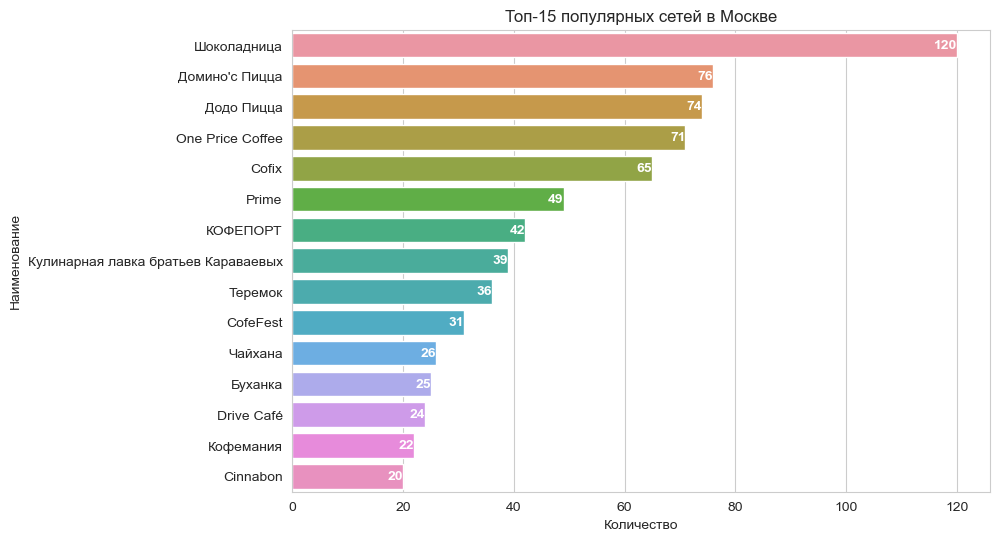

In [68]:
plt.figure(figsize=(9,6))
ax = sns.barplot(y='Наименование', x='Количество', data=chain_objects_top15)
for p in ax.patches:
    ax.text(p.get_width(),p.get_y()+p.get_height()/2., str(int(p.get_width())), 
            fontsize=10, color='white', weight='bold', ha='right', va='center')
plt.title('Топ-15 популярных сетей в Москве')
sns.set_style('whitegrid')
plt.show()    

Если под популярностью понимать количество заведений сети, то самой популярной в Москве является Шоколадница. Видимо, это действительно так. Бывая в Москве редко, с этой сетью я тоже знакома. В топ-3 попали также две сети пиццерий.

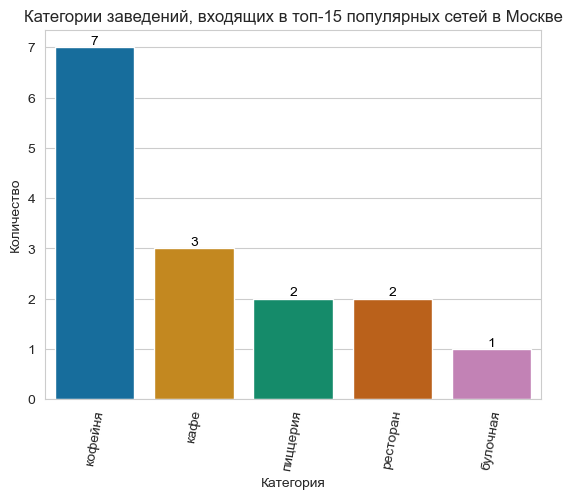

In [69]:
# Группировка Топ-15 сетей Москвы по категории заведений
chain_objects_top15_gr = (chain_objects_top15.groupby('Категория')['Количество']
                          .count().reset_index()
                          .sort_values('Количество', ascending=False)
                         )

# Строим график, отражающий категории заведений, входящий в Топ-15 по популярности
ax = sns.barplot(y='Количество', x='Категория', data=chain_objects_top15_gr)
for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), str(int(p.get_height())), 
            fontsize=10, color='black', ha='center', va='bottom')
plt.title('Категории заведений, входящих в топ-15 популярных сетей в Москве')
plt.xticks(rotation=80)
sns.set_style('whitegrid')
plt.show()

Почти половина сетей из топ-15 являются кофейнями.

Таким образом, несмотря на то, что в первую тройку популярных сетей попали две пиццерии, доля кофеен гораздо больше. В топ-15 других пиццерий нет.

#### Распределение заведений общественного питания по административным районам Москвы

In [70]:
# Создание сводной таблицы с подсчетом количества заведений разных категорий по районам
data_district_pivot = (data.pivot_table(index='district',columns='category',values='name',aggfunc=('count'))
                      .reset_index() 
                      )

# Добавление столбца с общим количеством заведений по району
data_district_pivot['Общее количество заведений'] = (data_district_pivot.
                                                     loc[:,'бар,паб':'столовая'].sum(axis=1)
                                                    )

# Переименование столбцов и сортировка по общему количеству заведений в районе
data_district_pivot = (data_district_pivot.
                       rename(columns={'district':'Административный округ','category':'заведения'})
                       .sort_values('Общее количество заведений', ascending=False)
                      )
data_district_pivot

category,Административный округ,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,Общее количество заведений
5,Центральный административный округ,364,50,87,464,428,113,666,66,2238
2,Северный административный округ,68,39,58,234,194,77,183,41,894
3,Северо-Восточный административный округ,63,28,82,269,159,68,175,40,884
8,Южный административный округ,68,25,85,264,131,73,190,44,880
1,Западный административный округ,51,37,62,239,150,71,209,23,842
0,Восточный административный округ,53,25,71,270,105,72,147,40,783
6,Юго-Восточный административный округ,38,13,67,282,89,55,137,25,706
7,Юго-Западный административный округ,38,27,61,238,96,64,157,17,698
4,Северо-Западный административный округ,23,12,30,115,62,40,107,18,407


По количеству заведений ожидаемо лидирует Центральный административный округ - более 2000 заведений. Меньше всего заведений в Северо-Западном административном округе - всего 407 точек общественного питания. Видимо, это самый "спальный" район Москвы. В остальных административных округах точек общественного питания примерно 700-900.

In [71]:
# Группировка данных для построения графика
data_district = (data.groupby(['district', 'category'])
                 .agg({'name' : 'count'})
                 .sort_values('name', ascending = False)
                 .reset_index()
                )

# Переименование административных округов на сокращенные
data_district['district'] = data_district['district'].str.replace('административный округ', '')

# Переименование столбцов
data_district = (data_district.
                 rename(columns={'district':'административный округ',\
                                'category':'категория заведения','name':'количество заведений'})
                )

# Построение графика
fig = px.bar(data_district,
             x='количество заведений',
             y='административный округ',
             color_discrete_sequence=px.colors.qualitative.Vivid,
             title='Количество заведений каждой категории по районам и их суммарное количество',
             template='plotly_white',                    
             color='категория заведения',
             text='количество заведений'
            )
fig.update_layout(yaxis={'categoryorder':'total ascending'})              
fig.show()

В датасете присутствует 9 административных округов Москвы: Восточный административный округ,    Западный административный округ, Северный административный округ, Северо-Восточный административный округ, Северо-Западный административный округ, Центральный административный округ, Юго-Восточный административный округ, Юго-Западный административный округ, Южный административный округ.

Гипотеза о том, что больше всего заведений в центре города, подтвердилась. При этом в центре больше всего ресторанов. Кафе и кофеен примерно поровну, чуть меньше баров и пабов. В остальных районах города лидерами по количеству заведений являются кафе, ресторанов и кофеен меньше, существенно меньше баров и пабов. В некоторых районах пиццерий и заведений быстрого питания больше, чем баров и пабов. Столовые и булочные в аутсайдерах во всех районах.

#### Анализ рейтинга заведений

In [72]:
data_rating_gr = data.groupby('category')['rating'].mean().reset_index().sort_values('rating', ascending=False)
data_rating_gr

,category,rating
0,"бар,паб",4.387467
6,ресторан,4.304921
5,пиццерия,4.301264
4,кофейня,4.277157
1,булочная,4.268359
7,столовая,4.211465
3,кафе,4.124084
2,быстрое питание,4.050249


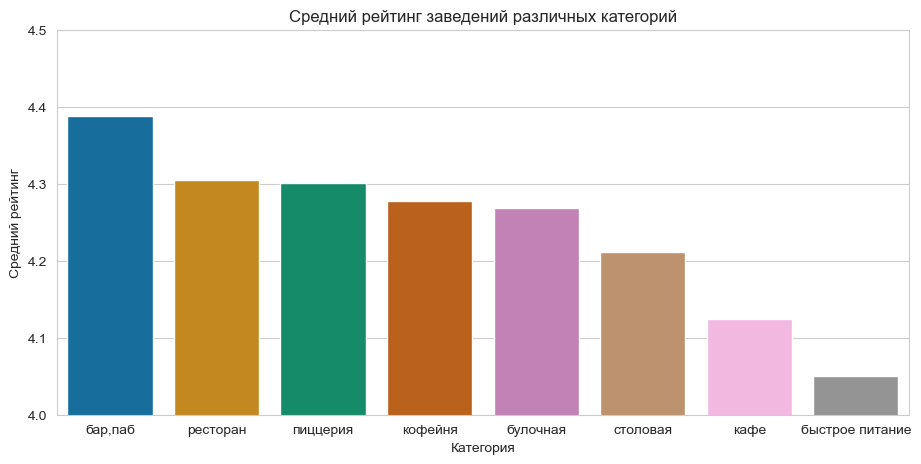

In [73]:
plt.figure(figsize=(11,5))
sns.barplot(x='category', y='rating', data=data_rating_gr)
plt.ylim(4,4.5)
plt.title('Средний рейтинг заведений различных категорий')
plt.ylabel('Средний рейтинг')
plt.xlabel('Категория')
sns.set_style('whitegrid')
plt.show()

Средние рейтинги отличаются несильно. Все они находятся в диапазоне от 4,05 до 4,38. Наименьший средний рейтинг у заведений быстрого питания, наибольший - у баров и пабов.

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Для этого посчитаем средний рейтинг заведений общественного питания по каждому административному округу.

In [74]:
rating_gr = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_gr

,district,rating
0,Восточный административный округ,4.179821
1,Западный административный округ,4.185511
2,Северный административный округ,4.239933
3,Северо-Восточный административный округ,4.150679
4,Северо-Западный административный округ,4.209337
5,Центральный административный округ,4.378150
6,Юго-Восточный административный округ,4.106232
7,Юго-Западный административный округ,4.177937
8,Южный административный округ,4.187614


In [75]:

# Читаем файл с округами Москвы и сохраняем в переменной
with open('D:/ФОТО/Яндекс.Практикум/Проекты/4.Общепит Москвы/admin_level_geomap.geojson', 'r', encoding="utf-8") as f:
    geo_json = json.load(f)
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Cоздаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_gr,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# Отображение всех заведений датасета на карте с помощью кластеров 
# Создание пустого кластера с добавлением его на карту
marker_cluster = MarkerCluster().add_to(m)

# Функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# Выводим карту
m    

Гипотеза о том, что рейтинг заведений в центре города выше, подтвердилась. Наименьший средний рейтинг у заведений Юго-Восточного административного округа. При этом у всех районов рейтинг заведений выше 4 при максимально возможном рейтинге в 5 баллов. 
В зависимости от категории заведения также нет кардинальных отличий в рейтинге, но все же отметим, что наименьший рейтинг у заведений быстрого питания, наибольший - у баров и пабов.

#### Топ-15 улиц по количеству заведений

In [76]:
#Топ-15 улиц по количеству заведений
street_objects_top15 = (data
                       .groupby(['street'])['name'].count().reset_index()
                       .sort_values('name', ascending=False)
                       .head(15)
                      )
# Переименование столбцов
street_objects_top15.columns = ['Наименование улицы','Количество заведений']
street_objects_top15




,Наименование улицы,Количество заведений
1085,проспект Мира,184
768,Профсоюзная улица,121
1082,проспект Вернадского,106
521,Ленинский проспект,106
519,Ленинградский проспект,95
370,Дмитровское шоссе,87
452,Каширское шоссе,77
295,Варшавское шоссе,74
520,Ленинградское шоссе,70
546,МКАД,65


In [77]:
# Группировка данных о количестве заведений по их категориям на топ-15 улиц
street_top_15=street_objects_top15['Наименование улицы']
street_category_top_15 = data.query('street in @street_top_15')
data_street = (street_category_top_15.groupby(['street','category'])
               .agg({'name' : 'count'})
               .reset_index()
               .sort_values('name', ascending=False)
              )

# Переименование столбцов
data_street = (data_street.
                 rename(columns={'street':'наименование улицы',\
                                'category':'категория заведения','name':'количество заведений'})
                )



In [78]:
# Построение графика
fig = px.bar(data_street,
             x='количество заведений',
             y='наименование улицы',
             color_discrete_sequence=px.colors.qualitative.Vivid,
             title='Распределения количества заведений и их категорий по топ-15 улиц',
             template='plotly_white',                    
             color='категория заведения',
             text='количество заведений'
            )
fig.update_layout(yaxis={'categoryorder':'total ascending'})              
fig.show()

Наибольшее количество заведений на проспекте Мира, который является лидером также по количеству кафе, ресторанов, кофеен и точек быстрого питания. Пиццерий больше всего на Профсоюзной улице - второй по общему количеству заведений общественного питания. В остальном структура заведений на Профсоюзной улице примерно такая же, как на проспекте Мира.

Среди топ-15 улиц по структуре заведений значительно отличается МКАД. На МКАДЕ из 65 заведений 45, т.е. больше половины, составляют кафе.


 #### Улицы, на которых находится только один объект общепита

In [79]:
# Отфильтруем улицы, на которых находится только один объект общепита.

street_one_object = (data
                       .groupby('street')['name'].count().reset_index()
                       .query('name==1')['street']
                      )



In [80]:
# Подсчет количества улиц, имеющих только одно заведение общепита
street_one_object_count = len(street_one_object)

f'Количество улиц, на которых находится только один объект общепита - {street_one_object_count}'


'Количество улиц, на которых находится только один объект общепита - 458'

In [81]:
# Срез датасета по улицам с одним объектом общепита
data_street_one = data.query('street in @street_one_object')



In [82]:
# Группировка улиц с одним объектом общепита по категориям заведений
data_street_one_cat = (data_street_one
                    .groupby('category')['name'].count()
                    .reset_index().sort_values('name', ascending=False)
                    .rename(columns={'category':'категория заведения','name':'количество заведений'})
                     )

data_street_one_cat

,категория заведения,количество заведений
3,кафе,161
6,ресторан,88
4,кофейня,85
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,18
1,булочная,8


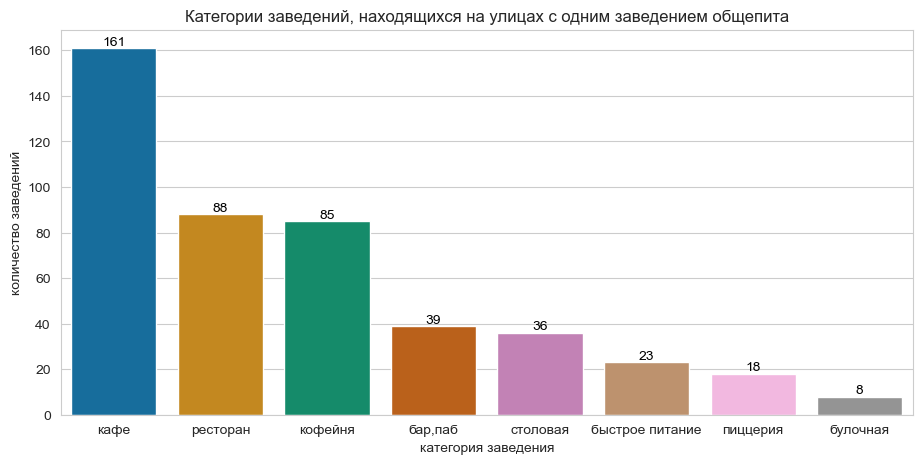

In [83]:
# Строим график, отражающий категории заведений на улицах с одним заведением общественного питания
plt.figure(figsize=(11,5))
ax = sns.barplot(y='количество заведений', x='категория заведения', data=data_street_one_cat)
for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), str(int(p.get_height())), 
            fontsize=10, color='black', ha='center', va='bottom')
plt.title('Категории заведений, находящихся на улицах с одним заведением общепита')
sns.set_style('whitegrid')
plt.show()

Категории заведений на улицах с одним заведением общепита почти повторяют структуру категорий заведений всего датасета, только столовые и пиццерии поменялись местами - столовых стало больше, чем заведений быстрого питания, а пиццерий меньше.

In [84]:
# Группировка улиц с одним объектом общепита по административным округам
data_street_one_distr = (data_street_one
                    .groupby('district')['name'].count()
                    .reset_index().sort_values('name', ascending=False)
                    .rename(columns={'district':'Административный округ','name':'Количество улиц с одним заведением'})
                    )
data_street_one_distr['Административный округ'] = data_street_one_distr['Административный округ'].str.replace('административный округ', '')
data_street_one_distr

,Административный округ,Количество улиц с одним заведением
5,Центральный,144
3,Северо-Восточный,55
0,Восточный,53
2,Северный,52
8,Южный,43
6,Юго-Восточный,40
1,Западный,34
4,Северо-Западный,19
7,Юго-Западный,18


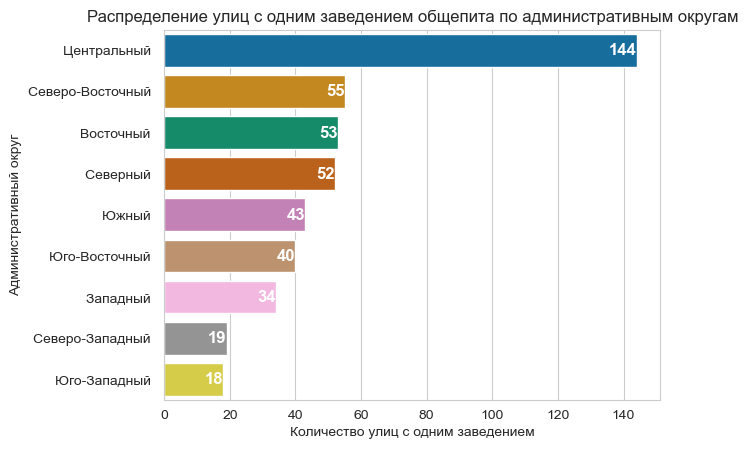

In [85]:
# Строим график, отражающий распределение улиц с одним заведением общепита по административным округам

ax = sns.barplot(y='Административный округ', x='Количество улиц с одним заведением', data=data_street_one_distr)
for p in ax.patches:
    ax.text(p.get_width(),p.get_y()+p.get_height()/2., str(int(p.get_width())), 
            fontsize=12, color='white', weight='bold', ha='right', va='center')
plt.title('Распределение улиц с одним заведением общепита по административным округам')
sns.set_style('whitegrid')
plt.show()

Улицы с одним заведением общепита есть во всех административных округах Москвы. Центральный административный округ лидирует не только по общему количеству заведений, но и по количеству улиц с одним заведением общественного питания. В аутсайдерах снова Юго-Западный и Северо-Западный административные округа. Остальное распределение изменилось, но незначительно.

In [86]:
data_street_one_raiting = (data_street_one.groupby('district', as_index=False)['rating']
                           .agg('mean')
                           .sort_values('rating', ascending=False)
                          )
data_street_one_raiting

,district,rating
5,Центральный административный округ,4.427083
2,Северный административный округ,4.244231
3,Северо-Восточный административный округ,4.181818
0,Восточный административный округ,4.152830
7,Юго-Западный административный округ,4.150000
4,Северо-Западный административный округ,4.126316
6,Юго-Восточный административный округ,4.122500
1,Западный административный округ,4.097059
8,Южный административный округ,4.090698


Лидером по среднему рейтингу заведений в данном случае также является Центральный административный округ, что еще раз подтверждает гипотезу о том, что более высокий рейтинг имеют заведения в центре города.

In [87]:
# Построение сводной таблицы с подсчетом количества сетевых и несетевых
data_street_one_chain = (data_street_one.pivot_table(index='chain_cat',values='name',aggfunc=('count'))
                       .reset_index()
                       .rename(columns={'chain_cat':'Категория заведения','name':'Количество'})
)

data_street_one_chain

,Категория заведения,Количество
0,несетевое,329
1,сетевое,129


In [88]:
fig = go.Figure(data=[go.Pie(labels=data_street_one_chain['Категория заведения'], values=data_street_one_chain['Количество'])])
fig.update_layout(title='Cоотношение сетевых и несетевых заведений общественного питания',
                  width=690, 
                  height=390,                 
                  annotations=[dict(x=1.23, 
                                    y=1.05,
                                    text='Тип заведения',
                                    showarrow=False)])
fig.show()

Как и во всем датасете преобладают несетевые заведения. Их доля даже увеличилась по сравнению с заведениями всего датасета.

Таким образом, улицы, на которых располагается только один объект общественного питания, находятся во всех административных округах Москвы. Наибольшее их число приходится на Центральный административный округ. 
На данных улицах преобладают кафе, рестораны и кофейни, в основном несетевые, с достаточно высоким рейтингом. Выше рейтинг у заведений в центре. 

#### Ценовые индикаторы административных округов

In [89]:
# Группировка данных и расчет ценового индикатора районов
avg_bill_gr = (data.groupby('district', as_index=False)['middle_avg_bill']
                 .median().sort_values('middle_avg_bill', ascending=False)
                )
avg_bill_gr

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,687.5
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [90]:
# Картограмма удалена из сокращенной версии проекта в связи с ограничением размера файла для предпросмотра на Git Hub.
# Карты есть в полной версии проекта и в презентации.

Самымы дорогими районами являются Центральный административный округ, что ожидаемо, и Западный административный округ. Медианное значение среднего счета по этим округам одинаковое и существенно выше остальных административных округов. Самый низкий медианный чек у заведений Юго-Восточного административного округа.

Нет видимой зависимости среднего чека заведений от их удаленности от центра города. Скорее прослеживается зависимость от престижности района. По данным Мосленты (https://moslenta.ru/city/sreda-obitaniya/luchshie-raiony-moskvy-dlya-zhizni-i-investicii.htm) исторически сложилось так, что самыми престижными после центра и районов в пределах ТТК считаются территории на западе столицы. Статус этих московских районов остался высоким со времен СССР, когда Кутузовский проспект был местом жительства почти всей советской элиты. Не удивительно, что и средний счет заведений этих мест не уступает центральным. На юге же Москвы расположены самые крупные очистные сооружения в Европе, районы рядом с ними считаются наименее престижными, что отражается и в ценах заведений.

#### Заведения общественного питания с круглосуточным режимом работы

Отдельно хотелось бы проанализировать наличие и распространенность круглосуточных заведений. В этом есть и личная заинтересованность. При разнице с Москвой в 4 часа, приезжая с детьми в столицу, актуально иметь возможность позавтракать ранее 7-00 Мск.

In [91]:
# Группировка по признаку круглосуточной работы заведения
is_24_7_count = data.groupby('is_24_7', as_index=False)['name'].count()

# Cтолбец с меткой о круглосуточной работе заведения заменяем на более читаемый
is_24_7_count['is_24_7'] = is_24_7_count['is_24_7'].apply(lambda x: 'круглосуточный' if x == True else 'другой')
is_24_7_count

,is_24_7,name
0,другой,7611
1,круглосуточный,721


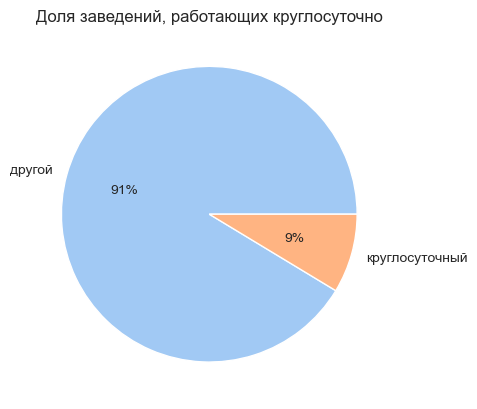

In [92]:
# Построение круговой диаграммы
colors = sns.color_palette('pastel')[ 0:5 ]

plt.pie(is_24_7_count['name'], labels = is_24_7_count['is_24_7'],colors = colors, autopct='%.0f%%')
plt.title('Доля заведений, работающих круглосуточно')
plt.show()

Всего 9% заведений общепита имеют круглосуточный график работы. Очень мало для Moscow never sleeps. Попробуем посмотреть по категориям.

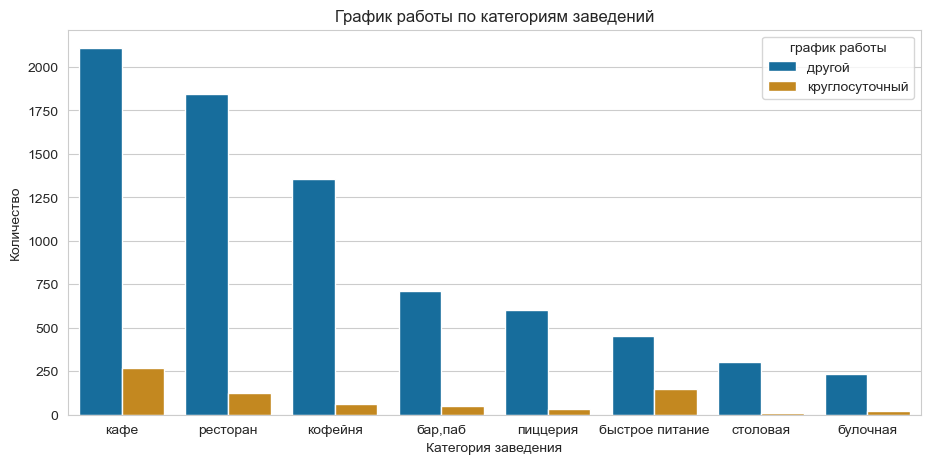

In [93]:
is_24_7_cat = (data.groupby(['category','is_24_7'], as_index=False)['name'].count()
               .rename(columns={'is_24_7':'график работы'})
               .sort_values('name', ascending=False)
              )
# Cтолбец с меткой о круглосуточной работе заведения заменяем на более читаемый
is_24_7_cat['график работы'] = is_24_7_cat['график работы'].apply(lambda x: 'круглосуточный' if x == True else 'другой')

# Строим график, отражающий соотношение круглосуточного графика работы и иного крафика по категориям заведений
plt.figure(figsize=(11,5))
sns.barplot(
    x='category', 
    y='name', 
    hue='график работы', 
    data=is_24_7_cat
)
plt.title('График работы по категориям заведений')
plt.ylabel('Количество')
plt.xlabel('Категория заведения')
sns.set_style('whitegrid')
plt.show()

Количество круглосуточных заведений мало в каждой категории, даже в быстром питании. Посмотрим, где сосредоточены круглосуточные заведения.

In [94]:
# Отфильтруем круглосуточные в отдельный датасет, который позже понадобится для нанесения круглосуточных заведений на карту
is_24_7_data = data.query('is_24_7==True')

# Сводная таблица распространения круглосуточных заведений по районам Москвы в разрезе категорий
is_24_7_distr = is_24_7_data.pivot_table(index = 'district',columns='category',values = 'name',aggfunc = 'count')
                
# Добавление столбца с общим количеством заведений по району
is_24_7_distr['Всего заведений'] = is_24_7_distr.loc[:,'бар,паб':'столовая'].sum(axis=1)
                                                  
is_24_7_distr 


category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,Всего заведений
district,,,,,,,,,
Восточный административный округ,1.0,6.0,21.0,32.0,5.0,8.0,19.0,2.0,94.0
Западный административный округ,5.0,NaN,18.0,25.0,9.0,2.0,11.0,1.0,71.0
Северный административный округ,4.0,5.0,14.0,28.0,5.0,2.0,11.0,2.0,71.0
Северо-Восточный административный округ,4.0,4.0,17.0,31.0,3.0,3.0,10.0,2.0,74.0
Северо-Западный административный округ,NaN,3.0,7.0,12.0,2.0,1.0,18.0,NaN,43.0
Центральный административный округ,29.0,1.0,14.0,30.0,26.0,2.0,26.0,3.0,131.0
Юго-Восточный административный округ,5.0,1.0,15.0,48.0,1.0,9.0,12.0,1.0,92.0
Юго-Западный административный округ,NaN,1.0,20.0,34.0,7.0,NaN,9.0,1.0,72.0
Южный административный округ,4.0,3.0,24.0,26.0,1.0,4.0,11.0,NaN,73.0


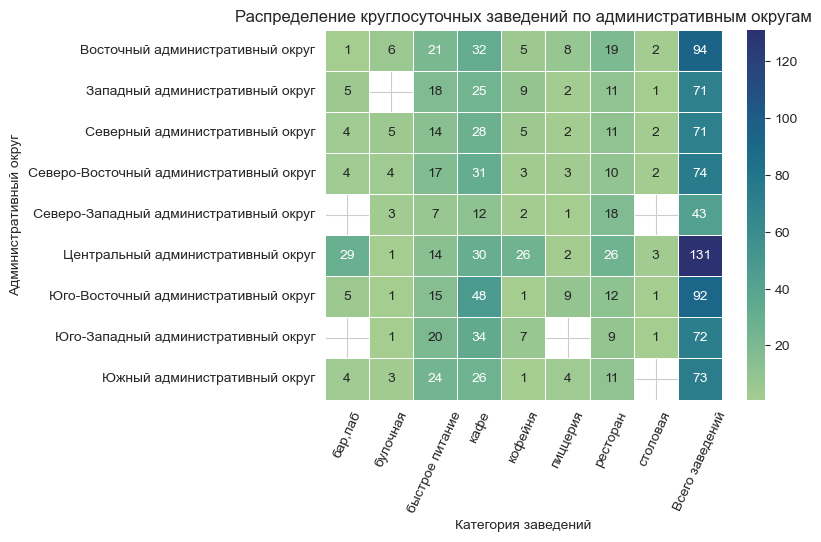

In [95]:
# Строим тепловую карту
sns.heatmap(is_24_7_distr,
            linewidths=.5,
            annot=True,
            cmap='crest',
            fmt=',.0f')
plt.title('Распределение круглосуточных заведений по административным округам')
plt.xlabel('Категория заведений')
plt.ylabel('Административный округ')
plt.xticks(rotation=65)
plt.show()


Ожидаемо больше всего круглосуточных заведений в Центральном административном округе. Второе место делят Восточный и Юго-Восточный административные округа. Меньше всего круглосуточных заведений в Северо-Западном административном округе, в этом АО и в принципе меньше заведений общественного питания. В остальных округах примерно поровну и почти в два раза меньше, чем в Центральном АО.

Стоит отметить, что больше всего круглосуточных кафе в Юго-Восточном администратиыном округе. Они составляют чуть больше половины всех круглосуточных заведений округа. В целом почти по всем административным округам большая часть круглосуточных заведений является кафе, за исключением Северо-Западного АО. Там чуть больше круглосуточных ресторанов.

В Центральном административном округе круглосуточная работа заведений равномерно распределена между барами, кафе, кофейнями и ресторанами, немного меньше круглосуточных объектов быстрого питания.
Центральный АО сильно отличается от других округов по количеству круглосуточных баров и кофеен - вот он центр сосредоточения ночной жизни.

Булочные, пиццерии и столовые не стремятся к круглосуточной работе ни в одном из административных округов Москвы.

Посмотрим, есть ли тенденция к сосредоточению круглосуточных заведений общепита в конкретных местах административных районов Москвы. Для этого для наглядности нанесем круглосуточные точки питания на карту.

In [96]:
# Картограмма удалена из сокращенной версии проекта в связи с ограничением размера файла для предпросмотра на Git Hub.
# Карты есть в полной версии проекта и в презентации.

В целом внутри административных округов круглосуточные заведения распределены достаточно равномерно. Выделяются Новый Арбат, а также Комсомольская площадь - площадь трех вокзалов. Также есть некоторое сосредоточение круглосуточных заведений вдоль Алтуфьевского шоссе, Щелковского шоссе и ул.Профсоюзной.

Таким образом, круглосуточные заведения есть, но их не так много. Москва - не Пекин, где даже в здании аэропорта ночью ничего не работает. Но все-же на огромный мегаполис заведений с круглосуточным режимом работы немного, возможно, недостаточно. Изучение спроса на подобные заведения - тема отдельного исследования.

#### Вывод

В данных представлены такие категории заведений, как бары/пабы, рестораны, кафе, кофейни, булочные, столовые, быстрое питание. Наибольшее распространенне имеют кафе, рестораны и кофейни. Меньше всего столовых и булочных.

В данных о количестве посадочных мест настолько много аномально высоких значений по всем типам заведений, что исключить их из данных невозможно, исправить тоже. Для того, чтобы использовать данные о количестве посадочных мест для принятия решений по открытию заведения общественного питания, необходимо найти корректные данные по этому параметру.

Доля сетевых заведений, представленных в датасете, составляет чуть более 60%. Сетевыми чаще бывают булочные, кофейни и пиццерии.

В топ-15 популярных сетей Москвы преобладают кофейни (7 сетей), но в топ-3 попали две сети пиццерий.

В датасете присутствуют все девять административных округов города Москвы. Центральный административный округ - лидер по количеству заведений. Меньше всего заведений в Северо-Западном административном округе. В центре больше ресторанов. В остальных районах города лидерами по количеству заведений являются кафе.

В Центральном административном округе не только больше заведений общественного питания, то и выше их рейтинг. Наименьший средний рейтинг у заведений Юго-Восточного административного округа. При этом у всех районов, как и у всех категорий заведений усредненный рейтинг выше 4 при максимально возможном рейтинге в 5 баллов.

Проспект Мира является улицей, на которой располагается наибольшее количество заведений среди всех улиц датасета. На нем находится больше всего кафе, ресторанов, кофеен и точек быстрого питания. 

При этом в датасете 458 улиц, на которых находится только один объект общепита. Такие улицы есть во всех административных округах Москвы. На данных улицах преобладают кафе, рестораны и кофейни, в основном несетевые, с достаточно высоким рейтингом. Выше рейтинг у заведений в центре. Таким образом, картина распределения заведений по улицам с одной точкой общепита практически повторяет их распределение в целом по Москве.

Самое высокое значение медианного чека приходится на заведения Центрального и Западного административных округов. Самым дешевым является Юго-Восточный административный округ. Нет видимой зависимости среднего чека заведений от их удаленности от центра города. Скорее прослеживается зависимость от престижности района.

Что касается круглосуточных заведений общественного питания, то их доля крайне мала и составляет всего 9% общего числа заведений датасета. Чаще других категорий заведений круглосуточными являются кафе. Больше всего круглосуточных заведений в Центральном административном округе, в частности на Арбате, Новом Арбате и Комсомольской площади - площади трех вокзалов. Возможно, круглосуточных заведений на огромный мегаполис недостаточно. Изучение спроса на подобные заведения - тема отдельного исследования.


### Детализируем исследование: открытие кофейни

#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [97]:
# Выделим информацию о кофейнях в отдельный датасет
data_coffee = data.query('category=="кофейня"')
data_coffee.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7,chain_cat
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,55.88161,37.48886,улица Маршала Федоренко,False,несетевое
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,unknown,unknown,NaN,NaN,1,NaN,55.87845,37.46003,парк Левобережный,False,сетевое
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,unknown,unknown,NaN,NaN,1,46.0,55.88584,37.51342,Коровинское шоссе,False,сетевое
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,unknown,unknown,NaN,NaN,1,NaN,55.87993,37.49252,улица Маршала Федоренко,False,сетевое
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,unknown,unknown,NaN,NaN,1,NaN,55.87853,37.47939,улица Дыбенко,False,сетевое


In [98]:
data_coffee.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1414 entries, 3 to 8400
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1414 non-null   object 
 1   category           1414 non-null   object 
 2   address            1414 non-null   object 
 3   district           1414 non-null   object 
 4   hours              1414 non-null   object 
 5   lat                1414 non-null   float64
 6   lng                1414 non-null   float64
 7   rating             1414 non-null   float64
 8   price              1414 non-null   object 
 9   avg_bill           1414 non-null   object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  579 non-null    float64
 12  chain              1414 non-null   int64  
 13  seats              752 non-null    float64
 14  lat_round          1414 non-null   float64
 15  lng_round          1414 non-null   float64
 16  street             1414 non-n

В получившемся датасете по кофейням 1414 строк. Соответственно кофеен у нас тоже 1414. Обратим внимание, что по некоторым кофейням указан средний чек, а не стоимость чашки капучино. 
Посмотрим распределение кофеен по районам.

In [99]:
# Доля кофеен от всех заведений общественного питания

f'Доля кофеен {data_coffee.shape[0]/data.shape[0]:.2%}'

'Доля кофеен 16.97%'

In [100]:
# Сводная таблица распределения кофеен по административным округам Москвы

data_coffee_distr = (data_coffee.pivot_table(
                                index = 'district',
                                values = 'name',
                                aggfunc = 'count')
                     .reset_index()
                     .sort_values('name', ascending=False)
                     .rename(columns={'district':'Административный округ','name':'Количество'})
                )

data_coffee_distr

,Административный округ,Количество
5,Центральный административный округ,428
2,Северный административный округ,194
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Больше всего кофеен, как и вообще заведений общепита, в Центральном административном округе, меньше всего - в Северо-Западном. Нанесем заведения на карту и посмотрим, есть ли точки сосредоточения кофеен. Для того, чтобы было проще ориентироваться, дополнительно отметим на карте станции метро.

In [101]:
# Создаем датафрейм с координатами станций метро (Источник данных: http://www.lovrikinfo.ru/metrogps.php)
metro_data = pd.DataFrame([['Аэропорт','55.79981','37.53412'],
['Академическая','55.68808','37.57501'],
['Алексеевская','55.80737','37.63844'],
['Александровский сад','55.75219','37.60836'],
['Алтуфьево','55.89504','37.58605'],
['Аннино (стр.)','55.581818','37.594978'],
['Арбатская','55.75228','37.60357'],
['Авиамоторная','55.75208','37.71677'],
['Автозаводская','55.70801','37.65858'],
['Бабушкинская','55.86814','37.66292'],
['Багратионовская','55.74326','37.49753'],
['Баррикадная','55.76027','37.58111'],
['Бауманская','55.77228','37.67857'],
['Беговая','55.77378','37.54412'],
['Белорусская','55.77492','37.58207'],
['Беляево','55.64371','37.52762'],
['Бибирево','55.88294','37.60523'],
['Библиотека им. Ленина','55.75211','37.60988'],
['Битцевский парк','55.60029','37.55735'],
['Боровицкая','55.75034','37.60857'],
['Ботанический сад','55.84649','37.63914'],
['Братеево (стр.)','55.631363','37.75174'],
['Братиславская','55.66126','37.7509'],
['Чеховская','55.76596','37.6075'],
['Черкизовская','55.802','37.74438'],
['Чертаново','55.63978','37.60893'],
['Чистые пруды','55.76426','37.6389'],
['Чкаловская','55.756218','37.659375'],
['Динамо','55.78867','37.55936'],
['Бульвар Дмитрия Донского (стр.)','55.567759','37.575724'],
['Дмитровская','55.80756','37.57959'],
['Добрынинская','55.72886','37.62356'],
['Домодедовская','55.61009','37.71612'],
['Достоевская (стр.)','55.782438','37.612747'],
['Дубровка','55.719732','37.676915'],
['Электрозаводская','55.78177','37.70471'],
['Шоссе энтузиастов','55.75837','37.75155'],
['Филевский парк','55.73953','37.48366'],
['Фили','55.74673','37.51384'],
['Фрунзенская','55.72718','37.58036'],
['Измайловская','55.78768','37.78329'],
['Улица Академика Янгеля (стр.)','55.596141','37.59981'],
['Каховская','55.65332','37.59722'],
['Калужская','55.65566','37.53923'],
['Кантемировская','55.6343','37.65632'],
['Каширская','55.65412','37.64738'],
['Киевская','55.74388','37.56673'],
['Китай город','55.75634','37.63002'],
['Китай город','55.753903','37.635405'],
['Коломенское','55.67745','37.66298'],
['Комсомольская','55.77717','37.655689'],
['Коньково','55.63253','37.52005'],
['Кожуховская','55.70533','37.68508'],
['Красногвардейская','55.614491','37.744724'],
['Краснопресненская','55.760109','37.577141'],
['Красносельская','55.780763','37.666264'],
['Красные ворота','55.76958','37.6499'],
['Крестьянская застава','55.732877','37.668998'],
['Кропоткинская','55.74525','37.60463'],
['Крылатское','55.75879','37.40633'],
['Кунцевская','55.73045','37.44646'],
['Курская','55.75848','37.65985'],
['Кутузовская','55.73947','37.53433'],
['Кузьминки','55.70531','37.76775'],
['Кузнецкий мост','55.76118','37.62386'],
['Ленинский проспект','55.70818','37.58742'],
['Лубянка','55.75876','37.62573'],
['Люблино','55.67694','37.76316'],
['Марьина роща (стр.)','55.793602','37.615762'],
['Марьино','55.65193','37.74771'],
['Марксистская','55.7407','37.65773'],
['Маяковская','55.76909','37.59635'],
['Медведково','55.88594','37.6612'],
['Менделеевская','55.78251','37.59792'],
['Минская (стр.)','55.731548','37.491016'],
['Проспект мира','55.781196','37.633529'],
['Митино (стр.)','55.84589','37.35909'],
['Молодежная','55.74001','37.41724'],
['Нагатинская','55.68386','37.62285'],
['Нагорная','55.67283','37.61019'],
['Нахимовский проспект','55.66376','37.60767'],
['Новые черемушки','55.66892','37.55417'],
['Новогиреево','55.75111','37.81564'],
['Новокосино (стр.)','55.740539','37.856347'],
['Новокузнецкая','55.74212','37.62901'],
['Новослободская','55.77921','37.6009'],
['Охотный ряд','55.75703','37.61614'],
['Октябрьское поле','55.793615','37.493496'],
['Октябрьская','55.729','37.61139'],
['Орехово','55.61214','37.69584'],
['Отрадное','55.86417','37.60488'],
['Парк культуры','55.73512','37.59328'],
['Парк Победы (стр.)','55.736559','37.512591'],
['Партизанская','55.78962','37.7479'],
['Павелецкая','55.7313','37.63612'],
['Печатники','55.69252','37.7295'],
['Перово','55.75109','37.78854'],
['Первомайская','55.79342','37.79979'],
['Петровско-Разумовская','55.83712','37.57349'],
['Пионерская','55.73583','37.46731'],
['Планерная','55.85931','37.43687'],
['Площадь Ильича','55.745663','37.681123'],
['Улица Подбельского','55.81503','37.73209'],
['Улица Подбельского','55.81336','37.73524'],
['Полежаевская','55.77691','37.51692'],
['Полянка','55.73654','37.61856'],
['Пражская','55.61354','37.60499'],
['Преображенская площадь','55.79655','37.71591'],
['Профсоюзная','55.67822','37.56381'],
['Пролетарская','55.73171','37.66726'],
['Пронская (стр.)','55.698344','37.850869'],
['Пушкинская','55.76565','37.60417'],
['Речной вокзал','55.85378','37.47679'],
['Площадь Революции','55.75646','37.62321'],
['Рижская','55.79222','37.63557'],
['Римская','55.746487','37.682631'],
['Рязанский проспект','55.71753','37.79425'],
['Cавеловская','55.79421','37.58666'],
['Щелковская','55.80955','37.79884'],
['Щукинская','55.80796','37.46629'],
['Cеменовская','55.78279','37.71844'],
['Cерпуховская','55.72658','37.62462'],
['Cевастопольская','55.65121','37.59939'],
['Шаболовская','55.71886','37.60797'],
['Cходненская','55.84937','37.43951'],
['Cлавянский бульвар (стр.)','55.729508','37.468829'],
['Cмоленская','55.74823','37.58384'],
['Cокол','55.80518','37.51495'],
['Cокольники','55.78893','37.67943'],
['Cпортивная','55.72397','37.56547'],
['Cретенский бульвар (стр.)','55.765551','37.635261'],
['Cтрогино (стр.)','55.80435','37.396363'],
['Cтуденческая','55.73873','37.54825'],
['Cухаревская','55.77211','37.63239'],
['Площадь Cуворова (стр.)','55.781984','37.614487'],
['Cвиблово','55.85543','37.65419'],
['Таганская','55.74255','37.65389'],
['Театральная','55.75857','37.6177'],
['Текстильшики','55.70947','37.73282'],
['Теплый стан','55.61814','37.50814'],
['Тимирязевская','55.81842','37.57571'],
['Третьяковская','55.74061','37.62492'],
['Трубная (стр.)','55.767605','37.6221'],
['Царицино','55.62011','37.66939'],
['Цветной бульвар','55.7716','37.62058'],
['Тульская','55.70901','37.6226'],
['Тургеневская','55.7646','37.63623'],
['Тушинская','55.8258','37.43621'],
['Тверская','55.7652','37.60352'],
['Улица 1905 года','55.76355','37.56375'],
['Университет','55.69167','37.53433'],
['Варшавская','55.65381','37.62084'],
['ВДНХ','55.82177','37.64107'],
['Проспект Вернадского','55.67613','37.5045'],
['Владыкино','55.84669','37.59251'],
['Водный стадион','55.8386','37.48749'],
['Войковская','55.81811','37.49905'],
['Волоколамская (стр.)','55.83459','37.38367'],
['Волгоградский проспект','55.7243','37.68795'],
['Волжская','55.69101','37.75498'],
['Воробьёвы горы','55.710454','37.558601'],
['Выхино','55.715','37.81802'],
['Ясенево','55.60535','37.53494'],
['Юго-западная','55.66464','37.48421'],
['Южная','55.62122','37.60752']]
            )

metro_data.head()

,0,1,2
0,Аэропорт,55.79981,37.53412
1,Академическая,55.68808,37.57501
2,Алексеевская,55.80737,37.63844
3,Александровский сад,55.75219,37.60836
4,Алтуфьево,55.89504,37.58605


In [102]:
# Создаём карту Москвы
m_cofee = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=data_coffee_distr,
    columns=['Административный округ', 'Количество'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Количество кофеен',
).add_to(m_cofee)

# Отображение всех заведений датасета на карте с помощью кластеров 
# Создание пустого кластера для кофеен с добавлением его на карту
marker_cluster_coffee = MarkerCluster().add_to(m_cofee)

# Функция, которая принимает строку датафрейма,
# Создаёт маркер в текущей точке и добавляет его в кластер marker_cluster_coffee
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['address']} {row['hours']}",
    ).add_to(marker_cluster_coffee)

# Применяем функцию create_clusters() к каждой строке датафрейма
data_coffee.apply(create_clusters, axis=1)

#МЕТРО
#Создание пустого кластера для станций метро с добавлением его на карту
marker_cluster_metro = MarkerCluster().add_to(m_cofee)
# Функция, которая принимает строку датафрейма,
# Создаёт маркер в текущей точке и добавляет его в кластер marker_cluster_metro
def create_clusters_metro(row):
    icon_url = 'https://img.icons8.com/?size=80&id=cbwMZiCNMlbu&format=png'
    icon = CustomIcon(icon_url, icon_size=(30,30))
    Marker(
        [row[1], row[2]],
        popup=f"{row[0]}",
        icon=icon,
    ).add_to(marker_cluster_metro)
# Применяем функцию create_clusters_metro к каждой строке датафрейма со станциями метро
metro_data.apply(create_clusters_metro, axis=1)



# Выводим карту
m_cofee  

В датасете 1414 кофеен, что составляет 16.97% всех заведений общепита. 30% кофеен находится в Центральном административном округе. Можно заметить, что многие кофейни располагаются вблизи станций метро.

#### Есть ли круглосуточные кофейни?

Круглосуточно работающие заведения рассматривались в предыдущем разделе. Кофейни также есть с круглосуточным режимом работы. Почти половина всех круглосуточных кофеен находится в Центральном административном округе. Там их 26.

In [103]:
# Всего круглосуточных кофеен
is_24_7_distr.loc[:,'кофейня'].sum()

59.0

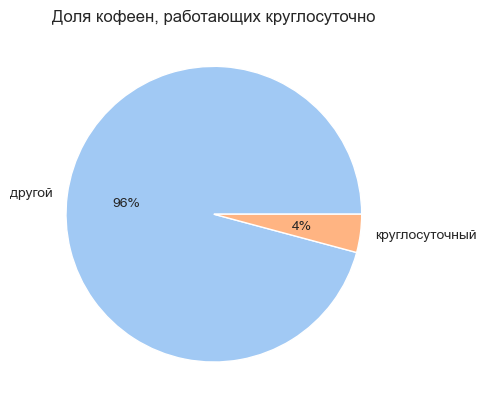

In [104]:
# Группировка по режиму работы
data_coffee_24_7 = data_coffee.groupby('is_24_7',as_index=False)['name'].count()

# Cтолбец с меткой о круглосуточной работе заведения заменяем на более читаемый
data_coffee_24_7['is_24_7'] = data_coffee_24_7['is_24_7'].apply(lambda x: 'круглосуточный' if x == True else 'другой')
data_coffee_24_7

# Доля круглосуточных кофеен

plt.pie(data_coffee_24_7['name'], labels = data_coffee_24_7['is_24_7'],colors = colors, autopct='%.0f%%')
plt.title('Доля кофеен, работающих круглосуточно')
plt.show()


Всего 59 кофеен из 1414, или 4%, работает круглосуточно. Почти половина из них сосредоточена в Центральном АО, остальные - единично по другим округам.

#### Какие у кофеен рейтинги? Как они распределяются по районам?

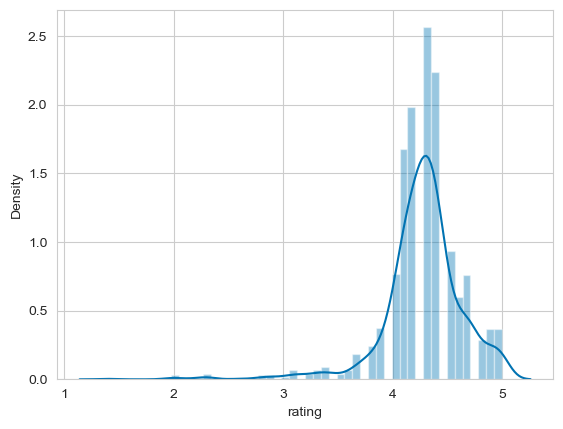

In [105]:
#Гистограмма рейтинга
sns.distplot(data_coffee['rating'])

plt.show()

Распределение близко к нормальному. В основном рейтинги от 4 до 4,5. Есть единичные аномально-низкие значения.

In [106]:
# Группируем данные о рейтингах кофеен по административным округам и считаем средний
data_coffee_gr = data_coffee.groupby('district', as_index=False)['rating'].agg('mean').sort_values('rating', ascending=False)
data_coffee_gr

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.290722
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [107]:
# Картограмма удалена из сокращенной версии проекта в связи с ограничением размера файла для предпросмотра на Git Hub.
# Карты есть в полной версии проекта и в презентации. 

На удивление кофейни Северо-Западного административного округа не отстают по рейтингу от Центрального АО. Худшие рейтинги у Западного АО и Северо-Восточного округов. Средние рейтинги всех кофеен достаточно высоки и принимают значения в диапазоне от 4,20 - 4,34.

#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [108]:
# Группировка данных и расчет ценового индикатора районов по стоимости чашки капучино
middle_coffee_cup_gr = (data_coffee.groupby('district', as_index=False)['middle_coffee_cup']
                 .median().sort_values('middle_coffee_cup', ascending=False)
                )
middle_coffee_cup_gr

,district,middle_coffee_cup
1,Западный административный округ,225.0
5,Центральный административный округ,205.0
7,Юго-Западный административный округ,199.5
4,Северо-Западный административный округ,174.0
3,Северо-Восточный административный округ,170.0
8,Южный административный округ,170.0
2,Северный административный округ,163.5
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,138.5


In [109]:
# Расчет медианной стоимости капучино в целом по Москве
data_coffee['middle_coffee_cup'].median()

179.0

In [110]:
# Расчет медианной стоимости капучино по медианам административных округов
middle_coffee_cup_gr['middle_coffee_cup'].median()

170.0

Медианная стоимость капучино в целом по Москве составляет 179 руб. В трех административных округах стоимость капучино выше. Медианная стоимость по административным округам чашки капучино составляет 170 руб. В трех АО стоимость ниже.

In [111]:
# Картограмма удалена из сокращенной версии проекта в связи с ограничением размера файла для предпросмотра на Git Hub.
# Карты есть в полной версии проекта и в презентации.

Неожиданно, но самый дорогой капучино не в Центральном АО, а в Западном. Центральный АО на втором месте и совсем немного выигрывает у Юго-Западного АО по медианной стоимости чашки капучино. Видимо, на ценообразование повлияла конкуренция. Напомню, что в Западном административном округе кофеен почти в три раза меньше, чем в Центральном. При этом ЗАО относится к дорогим и престижным районам. ЮЗАО только лишь на седьмом месте по количеству кофеен. 

Можно сделать вывод о том, что есть недостаток кофеен в Западном и Юго-Западном административных округах. Спрос там превышает предложение, поэтому цены высокие. Можно рассматривать вопрос об открытии кофейни в данных округах со стоимостью чашки капучино немного ниже медианной для данных районов, чтобы привлечь покупателей в незнакомую несетевую кофейню. Стоимость чашки капучино при открытии кофейни можно задать в диапазоне от 170 до 179 руб, т.е. между медианной стоимостью по АО и медианной стоимостью по всей Москве.

####  Есть ли кофейни, начинающие работу очень рано, например, с началом работы метро.

Все станции Московского метрополитена открыты для входа и пересадки с одной линии на другую ежедневно с 5 часов 30 минут утра до 1 часа ночи. Время отправления первых поездов со станций метрополитена: 5 часов 28 минут – 6 часов 5 минут.

In [112]:
data_coffee.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7,chain_cat
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,55.88161,37.48886,улица Маршала Федоренко,False,несетевое
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,unknown,unknown,NaN,NaN,1,NaN,55.87845,37.46003,парк Левобережный,False,сетевое
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,unknown,unknown,NaN,NaN,1,46.0,55.88584,37.51342,Коровинское шоссе,False,сетевое


In [113]:
# Выделим столбец open с данными о времени начала работы кофеен из столбца с графиком работы
data_coffee['open'] = data_coffee['hours'].str.split('–').str[0]
data_coffee['open'] = (data_coffee['open'].str.replace('ежедневно,','')
                       .str.replace('пн','').str.replace('пт','').str.replace('вт','').str.replace('ср','').str.replace('чт','')
                       .str.replace('сб','').str.replace(' ','').str.replace('вс','')
                       .str.replace('-','').str.replace(',','')
                      )
data_coffee.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7,chain_cat,open
777,One&Double,кофейня,"Москва, Коровинское шоссе, 1А",Северный административный округ,"ежедневно, 07:00–22:00",55.864742,37.545077,4.4,unknown,unknown,NaN,NaN,1,45.0,55.86474,37.54508,Коровинское шоссе,False,сетевое,07:00
187,CofeFest,кофейня,"Москва, Инженерная улица, 3с1",Северо-Восточный административный округ,пн-пт 08:00–19:00,55.878440,37.580627,2.9,unknown,unknown,NaN,NaN,1,NaN,55.87844,37.58063,Инженерная улица,False,сетевое,08:00
2069,Шоколадница,кофейня,"Москва, Шереметьевская улица, 6, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.795329,37.617417,4.1,средние,Средний счёт:650 ₽,650.0,256.0,1,120.0,55.79533,37.61742,Шереметьевская улица,False,сетевое,10:00
3804,Cinnabon,кофейня,"Москва, Благовещенский переулок, 5",Центральный административный округ,"ежедневно, 09:00–23:00",55.768153,37.598609,4.4,unknown,unknown,NaN,NaN,1,60.0,55.76815,37.59861,Благовещенский переулок,False,сетевое,09:00
4604,Кулинария,кофейня,"Москва, Новая Басманная улица, 30",Центральный административный округ,"ежедневно, 08:00–20:00",55.769622,37.667297,4.1,средние,Средний счёт:200–400 ₽,300.0,NaN,1,NaN,55.76962,37.66730,Новая Басманная улица,False,сетевое,08:00


In [114]:
# Посмотрим уникальные значения времени начала работы
data_coffee['open'].sort_values().unique()

array(['00:00', '06:00', '06:30', '06:55', '07:00', '07:15', '07:30',
       '07:40', '07:45', '07:59', '08:00', '08:15', '08:20', '08:30',
       '09:00', '09:30', '10:00', '11:00', '12:00', '13:00', '14:00',
       'unknown', 'круглосуточно'], dtype=object)

Видим странное время начала работы 00:00. Посмотрим на кофейни с таким временем работы.

In [115]:
# Срез по времени начала работы 00:00, 13:00, 14:00
data_coffee.query('open=="00:00" or open=="13:00" or open=="14:00"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7,chain_cat,open
3871,Музейное кафе,кофейня,"Москва, улица Воздвиженка, 5/25с1",Центральный административный округ,вт 13:00–21:00; ср 11:00–20:00; чт 13:00–21:00...,55.752597,37.607002,4.1,unknown,unknown,NaN,NaN,1,NaN,55.75260,37.60700,улица Воздвиженка,False,сетевое,13:00
4776,Кафе Арарат,кофейня,"Москва, Неглинная улица, 4",Центральный административный округ,"ежедневно, 13:00–22:00",55.759878,37.621292,4.4,unknown,unknown,NaN,NaN,0,86.0,55.75988,37.62129,Неглинная улица,False,несетевое,13:00
4790,Время чудес,кофейня,"Москва, 1-й Колобовский переулок, 17с1",Центральный административный округ,"ежедневно, 14:00–22:00",55.768722,37.618127,4.3,unknown,unknown,NaN,NaN,0,NaN,55.76872,37.61813,1-й Колобовский переулок,False,несетевое,14:00
8335,Baer Coffee,кофейня,"Москва, Окская улица, 1, корп. 1",Юго-Восточный административный округ,пн 00:00–21:00; вт-сб 09:00–21:00; вс 00:00–21:00,55.711757,37.751269,4.4,низкие,Цена чашки капучино:120–180 ₽,NaN,150.0,0,80.0,55.71176,37.75127,Окская улица,False,несетевое,00:00


Действительно, есть две кофейни, которые начинают свою работу ежедневно во второй половине дня.
Что касается, музейного кафе, то его график, видимо, зависит от работы музея архитектуры им.Щусева, в здании которого оно располагается.

Очень странный график работы у Bear Coffee. Вт-Сб кофейня работвет с 9 утра до 9 вечера, а в Вс и Пн открывается в полночь и работает до 9 вечера. Видимо, ошибка в данных. Согласно информации из интернета, данное кафе открыто ежедневно с 9 до 21. (https://yandex.ru/maps/org/bear_coffee/39838613397/?ll=37.752116%2C55.712381&z=15 или https://2gis.ru/moscow/firm/70000001058875425 )

Исправим график работы

In [116]:
# Замена времени начала работы 00:00 на корректное 09:00
data_coffee['open'] = data_coffee['open'].str.replace('00:00','09:00')

# Проверим
data_coffee.query('open=="00:00"')                       

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7,chain_cat,open


In [117]:
data_coffee['open'].sort_values().unique()

array(['06:00', '06:30', '06:55', '07:00', '07:15', '07:30', '07:40',
       '07:45', '07:59', '08:00', '08:15', '08:20', '08:30', '09:00',
       '09:30', '10:00', '11:00', '12:00', '13:00', '14:00', 'unknown',
       'круглосуточно'], dtype=object)

Теперь данные о начале работы выделены и корректны. Можно проанализировать.

In [118]:
# Группировка кофеен по времени начала работы и расчет количества кофеен с данным временем открытия
coffee_open_gr = data_coffee.groupby('open', as_index=False)['name'].count().sort_values('open')
coffee_open_gr.columns = ['Начало работы с', 'Количество']
coffee_open_gr                        

,Начало работы с,Количество
0,06:00,1
1,06:30,3
2,06:55,4
3,07:00,132
4,07:15,1
5,07:30,65
6,07:40,1
7,07:45,3
8,07:59,1
9,08:00,576


Итак, помимо небольшого количества круглосуточных кофеен, у нас есть одна кофейня, начинающая работу с 6 утра, три - с 6:30. Четыре кофейни открываются за 5 минут до 7:00, видимо, чтобы открыться чуть раньше расположенных рядом конкурентов. Еще 203 кофейни открываются в промежутке с 7:00 до 8:00. Основная же масса кофеен начинает работу с восьми утра.

Ни одна кофейня не начинает работу с открытием станций метро. Нанесем на карту кофейни, которые открываются до 8:00, а также круглосуточные. Дополнительно отразим на карте станции метро.

In [119]:
# Срез данных рано открывающихся кофеен
coffee_open_early = coffee_open_gr.loc[0:8]
coffee_open_early = coffee_open_early['Начало работы с']

# Датасет рано открывающихся и круглосуточных кофеен для отображения на карте
data_coffee_open_early = data_coffee.query('open in @coffee_open_early or open=="круглосуточно"')
data_coffee_open_early.head()


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,lat_round,lng_round,street,is_24_7,chain_cat,open
106,Вектор,кофейня,"Москва, Алтуфьевское шоссе, 48, корп. 1",Северо-Восточный административный округ,пн-пт 07:30–18:30,55.876142,37.588024,4.4,unknown,Цена чашки капучино:80–160 ₽,NaN,120.0,0,120.0,55.87614,37.58802,Алтуфьевское шоссе,False,несетевое,07:30
200,Wild Bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,unknown,unknown,NaN,NaN,1,20.0,55.87848,37.54343,Дмитровское шоссе,True,сетевое,круглосуточно
359,Кофе с собой Кофемол,кофейня,"Москва, Сходненская улица, 37",Северо-Западный административный округ,пн-сб 07:00–21:00; вс 08:00–20:00,55.849224,37.439205,4.4,unknown,Цена чашки капучино:100–170 ₽,NaN,135.0,0,27.0,55.84922,37.43920,Сходненская улица,False,несетевое,07:00
419,Cofix,кофейня,"Москва, Сходненская улица, 37",Северо-Западный административный округ,"пн-пт 07:00–22:00; сб,вс 08:00–22:00",55.849829,37.438924,4.3,unknown,unknown,NaN,NaN,1,27.0,55.84983,37.43892,Сходненская улица,False,сетевое,07:00
445,Кофе твой друг,кофейня,"Москва, Северо-Западный административный округ...",Северо-Западный административный округ,"ежедневно, 07:00–23:00",55.851415,37.438581,4.4,unknown,unknown,NaN,NaN,1,NaN,55.85142,37.43858,Северо-Западный административный округ,False,сетевое,07:00


Добавим на карту с ценовым индикатором районов по стоимости капучино рано работающие кофейни и станции  метро.

In [120]:
# Создаём карту Москвы
m_cofee_early = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# Хороплет по медиане стоимости чашки капучино
Choropleth(
    geo_data=geo_json,
    data=middle_coffee_cup_gr,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Ценовой индикатор районов по стоимости чашки капучино',
).add_to(m_cofee_early)

# Отображение всех заведений датасета на карте с помощью кластеров 
# Создание пустого кластера для кофеен с добавлением его на карту
marker_cluster_coffee_early = MarkerCluster().add_to(m_cofee_early)

# Функция, которая принимает строку датафрейма,
# Создаёт маркер в текущей точке и добавляет его в кластер marker_cluster_coffee_early
def create_clusters_coffee_early(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['address']} {row['hours']}",
    ).add_to(marker_cluster_coffee_early)

# Применяем функцию create_clusters_coffee_early() к каждой строке датафрейма
data_coffee_open_early.apply(create_clusters_coffee_early, axis=1)

#МЕТРО
#Создание пустого кластера для станций метро с добавлением его на карту
marker_cluster_metro = MarkerCluster().add_to(m_cofee_early)

# Применяем ранее созданную функцию create_clusters_metro() к каждой строке датафрейма со станциями метро
metro_data.apply(create_clusters_metro, axis=1)

# Выводим карту
m_cofee_early

В Западном АО вблизи многих станций метро расположены круглосуточные или достаточно рано открывающиеся кафе. Но, например, у метро Проспект Вернадского или Кунцевская, нет таких кофеен. Интересным может быть район станции Славянский бульвар, т.к. это крупный транспортный узел только с одной круглосуточной кофейней. Можно было бы выпить кофе, при пересадке с одного вида транспорта на другой.

В Юго-Западном АО нет раноработающих кофеен у метро Калужская, Коньково, Теплый стан, Университет. Среди этих станций метро наиболее перспективной считаю станцию Университет. Несмотря на то, что неподалеку есть одна кофейня, начинающая работать в будни с 7-30, она расположена не в непосредственной близости к станции, кроме того, у станции есть несколько выходов. Предполагаю, что по утрам здесь должен быть поток студентов, которые не прочь были бы выпить кофе по дороге на учебу.

В Новосибирске есть точки кофе, расположенные  в павильонах выходов из метро, работающие на вынос, без посадочных мест. Не знаю, приемлем ли такой формат для Москвы. Если допустимо такое расположение, то оно может быть перспективным.

Рекомендации - провести дополнительный анализ потока людей в утреннее время на станциях метро для того, чтобы определиться с конкретным местом для открытия кофейни.

####  Вывод
В датасете 1414 кофеен, что составляет 16.97% всех заведений общепита. 30% кофеен находится в Центральном административном округе. Всего 4% кофеен работает круглосуточно. Почти половина из них сосредоточена в Центральном АО.

Кофейни Северо-Западного административного округа не отстают по рейтингу от Центрального АО. Худшие рейтинги у Западного АО и Северо-Восточного округов. При этом в Западном АО самая высокая медианная стоимость чашки капучино. Это может говорить о превышении спроса над предлложением. Соответственно, ЗАО является перспективным районом для открытия кофейни со стоимостью чашки капучино в диапазоне от 170 до 179 руб, т.е. между медианной стоимостью по АО и медианной стоимостью по всей Москве.

В качестве конкретного места можно рассмотреть район станции метро Славянский бульвар, т.к. это крупный транспортный узел только с одной круглосуточной кофейней.

Еще одним перспективным местом представляется станция метро Университет в ЮЗАО, т.к. возможен большой утренний поток студентов.

Предпочтительный формат - кофейня без посадочных мест с ранним началом работы, близким к началу работы метро.

Рекомендации - провести дополнительный анализ потока людей в утреннее время на станциях метро для того, чтобы определиться с конкретным местом для открытия кофейни.


### Общий вывод и презентация

####  Общий вывод

В предоставленном для анализа датасете 8406 заведений общественного питания. В данных есть некоторое количество пропусков и аномальные значения. Часть аномальных значений среднего счета или стоимости чашки капучино исправлена. В части информации о посадочных местах аномально высоких значений настолько много, что провести достоверное исследование в данной части не представляется возможным. Пропуски в основном касаются времени работы заведений,количества посадочных мест, среднего чека.
Исправлены несколько категорий заведений, категорий цен в заведении.

В данных нет явных дубликатов строк. Часть дублирующихся заведений были выявлены и удалены. Появление таких дубликатов, видимо, связано с ручным внесением информации пользователями ЯндексБизнес. Большинство же заведений, похожих по наименованию на дубликаты, таковыми не являются.

После предобработки осталось более 99% данных, что является достаточным для анализа.

Для дальней работы  были добавлены столбцы с названием улиц и отметкой о круглосуточной работе заведения. Позднее в рамках детализации исследования категории "кофейни" был добавлен столбец с временем открытия заведений.

В данных представлено восемь категорий заведений. Тройка лидеров по количеству заведений - кафе, ресторан, кофейня. Меньше всего столовых и булочных.

Среди всего количества заведений общественного питания больше несетевых. Что касается сетевых, то они преобладают в таких категориях заведений, как: булочная, кофейня и пиццерия. При этом в кофейнях и пиццериях разница в количестве сетевых и несетевых заведениях небольшая. Таким образом, гипотеза о том, что в Москве преобладают сетевые заведения, не подтвердилась.

Почти половина сетей из топ-15 являются кофейнями.

Гипотеза о том, что больше всего заведений в центре города, подтвердилась. При этом в центре больше всего ресторанов. Кафе и кофеен примерно поровну, чуть меньше баров и пабов. В остальных районах города лидерами по количеству заведений являются кафе, ресторанов и кофеен меньше, существенно меньше баров и пабов. В некоторых районах пиццерий и заведений быстрого питания больше, чем баров и пабов. Столовые и булочные в аутсайдерах во всех районах.

Гипотеза о том, что рейтинг заведений в центре города выше, подтвердилась. Наименьший средний рейтинг у заведений Юго-Восточного административного округа. При этом у всех районом рейтинг заведений выше 4 при максимально возможном рейтинге в 5 баллов. В зависимости от категории заведения также нет кардинальных отличий в рейтинге, но все же отметим, что наименьший рейтинг у заведений быстрого питания, наибольший - у баров и пабов.

Наибольшее количество заведений на проспекте Мира, который является лидером также по количеству кафе, ресторанов, кофеен и точек быстрого питания. Пиццерий больше всего на Профсоюзной улице - второй по общему количеству заведений общественного питания. В остальном структура заведений на Профсоюзной улице примерно такая же, как на проспекте Мира.

Среди топ-15 улиц по структуре заведений значительно отличается МКАД. На МКАДЕ из 65 заведений 45, т.е. больше половины, составляют кафе.

Таким образом, улицы, на которых располагается только один объект общественного питания, находятся во всех административных округах Москвы. Наибольшее их число приходится на Центральный административный округ. 
На данных улицах преобладают кафе, рестораны и кофейни, в основном несетевые, с достаточно высоким рейтингом. Выше рейтинг у заведений в центре. 

Самымы дорогими районами являются Центральный административный округ, что ожидаемо, и Западный административный округ. Медианное значение среднего счета по этим округам одинаковое и существенно выше остальных административных округов. Самый низкий медианный чек у заведений Юго-Восточного административного округа.

Нет видимой зависимости среднего чека заведений от их удаленности от центра города. Скорее прослеживается зависимость от престижности района.

Всего 9% заведений общепита имеют круглосуточный график работы. По сосредоточенности круглосуточных заведений несколкьо выделяются Новый Арбат, а также Комсомольская площадь - площадь трех вокзалов. Чаще других категорий заведений круглосуточными являются кафе.
Таким образом, круглосуточные заведения есть, но их не так много, возможно, для огромного мегаполиса недостаточно. Изучение спроса на подобные заведения - тема отдельного исследования.

В датасете 1414 кофеен, что составляет 16.97% всех заведений общепита. 30% кофеен находится в Центральном административном округе. Всего 4% кофеен работает круглосуточно. Почти половина из них сосредоточена в Центральном АО.

Кофейни Северо-Западного административного округа не отстают по рейтингу от Центрального АО. Худшие рейтинги у Западного АО и Северо-Восточного округов. При этом в Западном АО самая высокая медианная стоимость чашки капучино. Это может говорить о превышении спроса над предлложением. Соответственно, ЗАО является перспективным районом для открытия кофейни со стоимостью чашки капучино в диапазоне от 170 до 179 руб, т.е. между медианной стоимостью по АО и медианной стоимостью по всей Москве.

В качестве конкретного места можно рассмотреть район станции метро Славянский бульвар, т.к. это крупный транспортный узел только с одной круглосуточной кофейней.

Еще одним перспективным местом представляется станция метро Университет в ЮЗАО, т.к. возможен большой утренний поток студентов.

Предпочтительный формат - кофейня без посадочных мест с ранним началом работы, близким к началу работы метро.

Рекомендации - провести дополнительный анализ потока людей в утреннее время на станциях метро для того, чтобы определиться с конкретным местом для открытия кофейни. Дополнительно можно изучить спрос на круглосуточные и ранооткрывающиеся заведения.

####  Презентация

Презентация: <https://disk.yandex.ru/i/vYIwBbbpWT9sLA> 